In [ ]:
## Columns Meaning
####Country: Country
#Year: Year
#Status: Country Developed or Developing status
#Life expectancy: Life expectancy in age
#Adult Mortality: Adult Mortality Rates of both sexes (probability of dying between 15 and 60 years per 1000 population)
#infant deaths: Number of Infant Deaths per 1000 population
#Alcohol: Alcohol, recorded per capita (15+) consumption (in litres of pure alcohol) -percentage expenditure: Expenditure on health as a percentage of Gross Domestic Product per capita(%)
#Hepatitis B: Hepatitis B (HepB) immunization coverage among 1-year-olds (%)
#Measles: Measles - number of reported cases per 1000 population
#BMI: Average Body Mass Index of entire population
#under-five deaths: Number of under-five deaths per 1000 population
#Polio: Polio (Pol3) immunization coverage among 1-year-olds (%)
#Total expenditure: General government expenditure on health as a percentage of total government expenditure (%)
#Diphtheria: Diphtheria tetanus toxoid and pertussis (DTP3) immunization coverage among 1-year-olds (%)
#HIV/AIDS: Deaths per 1 000 live births HIV/AIDS (0-4 years)
#GDP: Gross Domestic Product per capita (in USD)
#Population: Population of the country
#thinness 1-19 years: Prevalence of thinness among children and adolescents for Age 10 to 19 (%)
#thinness 5-9 years: Prevalence of thinness among children for Age 5 to 9(%)
#Income composition of resources: Human Development Index in terms of income composition of resources (index ranging from 0 to 1)
#Schooling: Number of years of Schooling(years)

#                              Life Expectancy Prediction

In [1]:
import pandas as pd
import numpy as np
import scipy
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib_inline
pd.options.display.float_format = '{:.2f}'.format
pd.set_option("max_columns", None)
pd.set_option("max_rows", None)
import warnings
warnings.filterwarnings('ignore')

# Import the data

In [2]:
data = pd.read_excel('Life Expectancy Data.csv.xlsx')
data

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,Afghanistan,2015.00,Developing,65.00,263.00,62.00,0.01,71.28,65.00,1154.00,19.10,83.00,6.00,8.16,65.00,0.10,584.26,33736494.00,17.20,17.30,0.48,10.10
1,Afghanistan,2014.00,Developing,59.90,271.00,64.00,0.01,73.52,62.00,492.00,18.60,86.00,58.00,8.18,62.00,0.10,612.70,327582.00,17.50,17.50,0.48,10.00
2,Afghanistan,2013.00,Developing,59.90,268.00,66.00,0.01,73.22,64.00,430.00,18.10,89.00,62.00,8.13,64.00,0.10,631.74,31731688.00,17.70,17.70,0.47,9.90
3,Afghanistan,2012.00,Developing,59.50,272.00,69.00,0.01,78.18,67.00,2787.00,17.60,93.00,67.00,8.52,67.00,0.10,669.96,3696958.00,17.90,18.00,0.46,9.80
4,Afghanistan,2011.00,Developing,59.20,275.00,71.00,0.01,7.10,68.00,3013.00,17.20,97.00,68.00,7.87,68.00,0.10,63.54,2978599.00,18.20,18.20,0.45,9.50
5,Afghanistan,2010.00,Developing,58.80,279.00,74.00,0.01,79.68,66.00,1989.00,16.70,102.00,66.00,9.20,66.00,0.10,553.33,2883167.00,18.40,18.40,0.45,9.20
6,Afghanistan,2009.00,Developing,58.60,281.00,77.00,0.01,56.76,63.00,2861.00,16.20,106.00,63.00,9.42,63.00,0.10,445.89,284331.00,18.60,18.70,0.43,8.90
7,Afghanistan,2008.00,Developing,58.10,287.00,80.00,0.03,25.87,64.00,1599.00,15.70,110.00,64.00,8.33,64.00,0.10,373.36,2729431.00,18.80,18.90,0.43,8.70
8,Afghanistan,2007.00,Developing,57.50,295.00,82.00,0.02,10.91,63.00,1141.00,15.20,113.00,63.00,6.73,63.00,0.10,369.84,26616792.00,19.00,19.10,0.41,8.40
9,Afghanistan,2006.00,Developing,57.30,295.00,84.00,0.03,17.17,64.00,1990.00,14.70,116.00,58.00,7.43,58.00,0.10,272.56,2589345.00,19.20,19.30,0.41,8.10


## Explore the data

In [3]:
data.shape

(2938, 22)

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2938 entries, 0 to 2937
Data columns (total 22 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Country                          2938 non-null   object 
 1   Year                             2938 non-null   float64
 2   Status                           2938 non-null   object 
 3   Life expectancy                  2928 non-null   float64
 4   Adult Mortality                  2928 non-null   float64
 5   infant deaths                    2938 non-null   float64
 6   Alcohol                          2744 non-null   float64
 7   percentage expenditure           2938 non-null   float64
 8   Hepatitis B                      2385 non-null   float64
 9   Measles                          2938 non-null   float64
 10  BMI                              2904 non-null   float64
 11  under-five deaths                2938 non-null   float64
 12  Polio               

In [5]:
df = data.copy()

In [6]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Year,2938.00,2007.52,4.61,2000.00,2004.00,2008.00,2012.00,2015.00
Life expectancy,2928.00,69.22,9.52,36.30,63.10,72.10,75.70,89.00
Adult Mortality,2928.00,164.80,124.29,1.00,74.00,144.00,228.00,723.00
infant deaths,2938.00,30.30,117.93,0.00,0.00,3.00,22.00,1800.00
Alcohol,2744.00,4.60,4.05,0.01,0.88,3.75,7.70,17.87
percentage expenditure,2938.00,738.25,1987.91,0.00,4.69,64.91,441.53,19479.91
Hepatitis B,2385.00,80.94,25.07,1.00,77.00,92.00,97.00,99.00
Measles,2938.00,2419.59,11467.27,0.00,0.00,17.00,360.25,212183.00
BMI,2904.00,38.32,20.04,1.00,19.30,43.50,56.20,87.30
under-five deaths,2938.00,42.04,160.45,0.00,0.00,4.00,28.00,2500.00


In [7]:
df.describe(include='object')

,Country,Status
count,2938,2938
unique,193,2
top,Afghanistan,Developing
freq,16,2426


In [8]:
# we rename the columns names to access easily

df.rename(columns = {'Country':'country',
                       'Year':'year',
                       'Status':'status',
                       'Life expectancy':'life_expectancy', 
                       'Adult Mortality':'adult_mortality', 
                       'infant deaths':'infant_deaths',
                       'Alcohol':'alchohol',
                       'percentage expenditure':'percentage_expenditure',
                       'Hepatitis B':'hepatitis_b',
                       'Measles':'measles',
                       'BMI':'bmi',
                       'under-five deaths':'under-five_deaths',
                       'Polio':'polio',
                       'Total expenditure':'total_expenditure',
                       'Diphtheria':'diphtheria',
                       'HIV/AIDS':'hiv/aids',
                       'GDP':'gdp',
                       'Population':'population',
                       'thinness  1-19 years':'thinness_1_19_years',
                       'thinness 5-9 years':'thinness_5_9_years',
                       'Income composition of resources':'income_composition_of_resources',
                       'Schooling':'schooling'
                       },inplace = True)

df.columns

Index(['country', 'year', 'status', 'life_expectancy', 'adult_mortality',
       'infant_deaths', 'alchohol', 'percentage_expenditure', 'hepatitis_b',
       'measles', 'bmi', 'under-five_deaths', 'polio', 'total_expenditure',
       'diphtheria', 'hiv/aids', 'gdp', 'population', 'thinness_1_19_years',
       'thinness_5_9_years', 'income_composition_of_resources', 'schooling'],
      dtype='object')

In [9]:
# check for duplicated values
df.duplicated().sum()

0

In [10]:
### check for missing values

In [11]:
data.isnull().sum()

Country                              0
Year                                 0
Status                               0
Life expectancy                     10
Adult Mortality                     10
infant deaths                        0
Alcohol                            194
percentage expenditure               0
Hepatitis B                        553
Measles                              0
BMI                                 34
under-five deaths                    0
Polio                               19
Total expenditure                  226
Diphtheria                          19
HIV/AIDS                             0
GDP                                448
Population                         652
thinness  1-19 years                34
thinness 5-9 years                  34
Income composition of resources    167
Schooling                          163
dtype: int64

#### it's good we have no duplicated values in this data set

In [12]:
df[df.columns[df.isnull().any()]]

,life_expectancy,adult_mortality,alchohol,hepatitis_b,bmi,polio,total_expenditure,diphtheria,gdp,population,thinness_1_19_years,thinness_5_9_years,income_composition_of_resources,schooling
0,65.00,263.00,0.01,65.00,19.10,6.00,8.16,65.00,584.26,33736494.00,17.20,17.30,0.48,10.10
1,59.90,271.00,0.01,62.00,18.60,58.00,8.18,62.00,612.70,327582.00,17.50,17.50,0.48,10.00
2,59.90,268.00,0.01,64.00,18.10,62.00,8.13,64.00,631.74,31731688.00,17.70,17.70,0.47,9.90
3,59.50,272.00,0.01,67.00,17.60,67.00,8.52,67.00,669.96,3696958.00,17.90,18.00,0.46,9.80
4,59.20,275.00,0.01,68.00,17.20,68.00,7.87,68.00,63.54,2978599.00,18.20,18.20,0.45,9.50
5,58.80,279.00,0.01,66.00,16.70,66.00,9.20,66.00,553.33,2883167.00,18.40,18.40,0.45,9.20
6,58.60,281.00,0.01,63.00,16.20,63.00,9.42,63.00,445.89,284331.00,18.60,18.70,0.43,8.90
7,58.10,287.00,0.03,64.00,15.70,64.00,8.33,64.00,373.36,2729431.00,18.80,18.90,0.43,8.70
8,57.50,295.00,0.02,63.00,15.20,63.00,6.73,63.00,369.84,26616792.00,19.00,19.10,0.41,8.40
9,57.30,295.00,0.03,64.00,14.70,58.00,7.43,58.00,272.56,2589345.00,19.20,19.30,0.41,8.10


In [13]:
# check the missing values if we have
df.isnull().sum()/df.shape[0]*100

country                            0.00
year                               0.00
status                             0.00
life_expectancy                    0.34
adult_mortality                    0.34
infant_deaths                      0.00
alchohol                           6.60
percentage_expenditure             0.00
hepatitis_b                       18.82
measles                            0.00
bmi                                1.16
under-five_deaths                  0.00
polio                              0.65
total_expenditure                  7.69
diphtheria                         0.65
hiv/aids                           0.00
gdp                               15.25
population                        22.19
thinness_1_19_years                1.16
thinness_5_9_years                 1.16
income_composition_of_resources    5.68
schooling                          5.55
dtype: float64

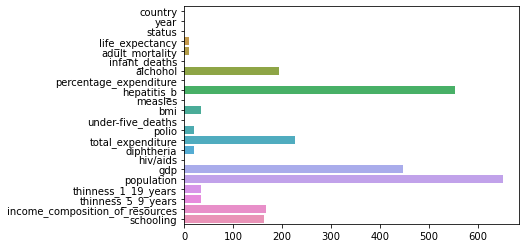

In [14]:
# visualization the missing values
missing_values = sns.barplot(df.isna().sum(),df.columns)

#### so we have 14 columns which is have missing values

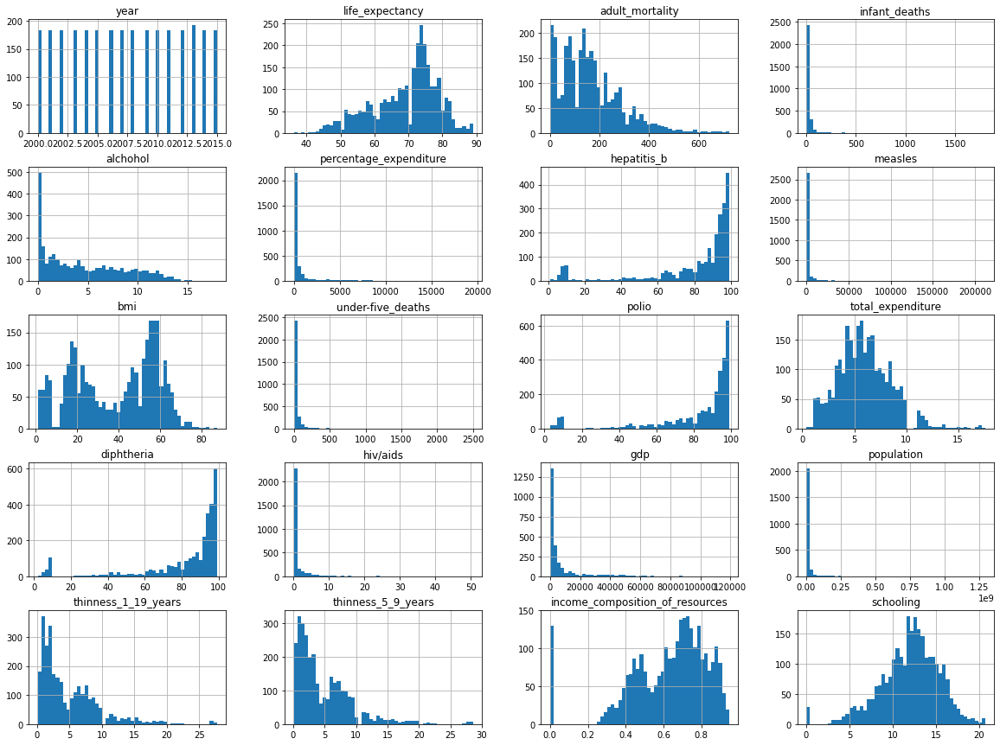

In [15]:
# visualize the distribution and analysis it
df.hist(bins=50, figsize=(20,15))
plt.show()

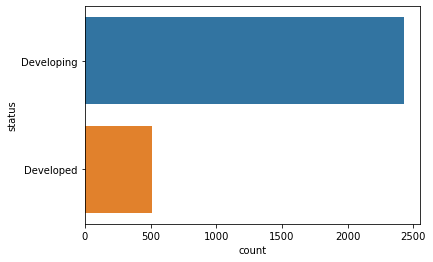

In [16]:
sns.countplot(y='status', data=df)
plt.show()

## Handling the missing values

#### LIfe_Expectancy

In [17]:
df[df['life_expectancy'].isnull()]


,country,year,status,life_expectancy,adult_mortality,infant_deaths,alchohol,percentage_expenditure,hepatitis_b,measles,bmi,under-five_deaths,polio,total_expenditure,diphtheria,hiv/aids,gdp,population,thinness_1_19_years,thinness_5_9_years,income_composition_of_resources,schooling
624,Cook Islands,2013.00,Developing,NaN,NaN,0.00,0.01,0.00,98.00,0.00,82.80,0.00,98.00,3.58,98.00,0.10,NaN,NaN,0.10,0.10,NaN,NaN
769,Dominica,2013.00,Developing,NaN,NaN,0.00,0.01,11.42,96.00,0.00,58.40,0.00,96.00,5.58,96.00,0.10,722.76,NaN,2.70,2.60,0.72,12.70
1650,Marshall Islands,2013.00,Developing,NaN,NaN,0.00,0.01,871.88,8.00,0.00,81.60,0.00,79.00,17.24,79.00,0.10,3617.75,NaN,0.10,0.10,NaN,0.00
1715,Monaco,2013.00,Developing,NaN,NaN,0.00,0.01,0.00,99.00,0.00,NaN,0.00,99.00,4.30,99.00,0.10,NaN,NaN,NaN,NaN,NaN,NaN
1812,Nauru,2013.00,Developing,NaN,NaN,0.00,0.01,15.61,87.00,0.00,87.30,0.00,87.00,4.65,87.00,0.10,136.18,NaN,0.10,0.10,NaN,9.60
1909,Niue,2013.00,Developing,NaN,NaN,0.00,0.01,0.00,99.00,0.00,77.30,0.00,99.00,7.20,99.00,0.10,NaN,NaN,0.10,0.10,NaN,NaN
1958,Palau,2013.00,Developing,NaN,NaN,0.00,NaN,344.69,99.00,0.00,83.30,0.00,99.00,9.27,99.00,0.10,1932.12,292.00,0.10,0.10,0.78,14.20
2167,Saint Kitts and Nevis,2013.00,Developing,NaN,NaN,0.00,8.54,0.00,97.00,0.00,5.20,0.00,96.00,6.14,96.00,0.10,NaN,NaN,3.70,3.60,0.75,13.40
2216,San Marino,2013.00,Developing,NaN,NaN,0.00,0.01,0.00,69.00,0.00,NaN,0.00,69.00,6.50,69.00,0.10,NaN,NaN,NaN,NaN,NaN,15.10
2713,Tuvalu,2013.00,Developing,NaN,NaN,0.00,0.01,78.28,9.00,0.00,79.30,0.00,9.00,16.61,9.00,0.10,3542.14,1819.00,0.20,0.10,NaN,0.00


#### Upon observation we find that the country with missing life_expectancy, have data for only 1 year 
####  we cannot impute them with developing countries mean because the countries are different 
#### so we gonna remove the null values in life_expectancy and adult_mortality columns they have common rows of null values

In [18]:
# we gonna drop the null values
df.drop(df[df['life_expectancy'].isnull()].index, inplace = True)

### Alchohol

In [19]:
# null values 
df[df['alchohol'].isnull()]

,country,year,status,life_expectancy,adult_mortality,infant_deaths,alchohol,percentage_expenditure,hepatitis_b,measles,bmi,under-five_deaths,polio,total_expenditure,diphtheria,hiv/aids,gdp,population,thinness_1_19_years,thinness_5_9_years,income_composition_of_resources,schooling
32,Algeria,2015.00,Developing,75.60,19.00,21.00,NaN,0.00,95.00,63.00,59.50,24.00,95.00,NaN,95.00,0.10,4132.76,39871528.00,6.00,5.80,0.74,14.40
48,Angola,2015.00,Developing,52.40,335.00,66.00,NaN,0.00,64.00,118.00,23.30,98.00,7.00,NaN,64.00,1.90,3695.79,2785935.00,8.30,8.20,0.53,11.40
64,Antigua and Barbuda,2015.00,Developing,76.40,13.00,0.00,NaN,0.00,99.00,0.00,47.70,0.00,86.00,NaN,99.00,0.20,13566.95,NaN,3.30,3.30,0.78,13.90
80,Argentina,2015.00,Developing,76.30,116.00,8.00,NaN,0.00,94.00,0.00,62.80,9.00,93.00,NaN,94.00,0.10,13467.12,43417765.00,1.00,0.90,0.83,17.30
96,Armenia,2015.00,Developing,74.80,118.00,1.00,NaN,0.00,94.00,33.00,54.90,1.00,96.00,NaN,94.00,0.10,369.65,291695.00,2.10,2.20,0.74,12.70
112,Australia,2015.00,Developed,82.80,59.00,1.00,NaN,0.00,93.00,74.00,66.60,1.00,93.00,NaN,93.00,0.10,56554.39,23789338.00,0.60,0.60,0.94,20.40
128,Austria,2015.00,Developed,81.50,65.00,0.00,NaN,0.00,93.00,309.00,57.60,0.00,93.00,NaN,93.00,0.10,43665.95,8633169.00,1.90,2.10,0.89,15.90
144,Azerbaijan,2015.00,Developing,72.70,118.00,5.00,NaN,0.00,96.00,0.00,52.50,6.00,98.00,NaN,96.00,0.10,55.31,9649341.00,2.80,2.90,0.76,12.70
160,Bahamas,2015.00,Developing,76.10,147.00,0.00,NaN,0.00,95.00,0.00,64.50,0.00,95.00,NaN,95.00,0.10,NaN,NaN,2.50,2.50,0.79,12.60
176,Bahrain,2015.00,Developing,76.90,69.00,0.00,NaN,0.00,98.00,0.00,63.60,0.00,98.00,NaN,98.00,0.10,22688.88,NaN,6.20,6.10,0.82,14.50


In [20]:
# get the count of the contries which is contain null values 
df[df['alchohol'].isnull()].groupby(['country']).count()

,year,status,life_expectancy,adult_mortality,infant_deaths,alchohol,percentage_expenditure,hepatitis_b,measles,bmi,under-five_deaths,polio,total_expenditure,diphtheria,hiv/aids,gdp,population,thinness_1_19_years,thinness_5_9_years,income_composition_of_resources,schooling
country,,,,,,,,,,,,,,,,,,,,,
Algeria,1,1,1,1,1,0,1,1,1,1,1,1,0,1,1,1,1,1,1,1,1
Angola,1,1,1,1,1,0,1,1,1,1,1,1,0,1,1,1,1,1,1,1,1
Antigua and Barbuda,1,1,1,1,1,0,1,1,1,1,1,1,0,1,1,1,0,1,1,1,1
Argentina,1,1,1,1,1,0,1,1,1,1,1,1,0,1,1,1,1,1,1,1,1
Armenia,1,1,1,1,1,0,1,1,1,1,1,1,0,1,1,1,1,1,1,1,1
Australia,1,1,1,1,1,0,1,1,1,1,1,1,0,1,1,1,1,1,1,1,1
Austria,1,1,1,1,1,0,1,1,1,1,1,1,0,1,1,1,1,1,1,1,1
Azerbaijan,1,1,1,1,1,0,1,1,1,1,1,1,0,1,1,1,1,1,1,1,1
Bahamas,1,1,1,1,1,0,1,1,1,1,1,1,0,1,1,0,0,1,1,1,1


#### South Sudan is a new country with a 'lot' of missing data

#### It would be safe to drop rows of South Sudan

In [21]:
df.drop(df[df['country']=='South Sudan'].index, inplace = True)

#### Remaining null values are in different countries and eatch country have only one or two nan values 
#### All the data for alchohol missing is from 2015
#### Hence we can use Back fill to fill the data

In [22]:
# fill the null values with the backward fill
column = ['alchohol']
df.loc[:,column] = df.loc[:,column].bfill()

### Hepatitis B

In [23]:
df[(df['hepatitis_b'].isnull())]

,country,year,status,life_expectancy,adult_mortality,infant_deaths,alchohol,percentage_expenditure,hepatitis_b,measles,bmi,under-five_deaths,polio,total_expenditure,diphtheria,hiv/aids,gdp,population,thinness_1_19_years,thinness_5_9_years,income_composition_of_resources,schooling
44,Algeria,2003.00,Developing,71.70,146.00,20.00,0.34,25.02,NaN,15374.00,47.00,23.00,87.00,3.60,87.00,0.10,294.34,3243514.00,6.30,6.10,0.66,11.50
45,Algeria,2002.00,Developing,71.60,145.00,20.00,0.36,148.51,NaN,5862.00,46.10,23.00,86.00,3.73,86.00,0.10,1774.34,3199546.00,6.30,6.20,0.65,11.10
46,Algeria,2001.00,Developing,71.40,145.00,20.00,0.23,147.99,NaN,2686.00,45.30,24.00,89.00,3.84,89.00,0.10,1732.86,31592153.00,6.40,6.30,0.64,10.90
47,Algeria,2000.00,Developing,71.30,145.00,21.00,0.25,154.46,NaN,0.00,44.40,25.00,86.00,3.49,86.00,0.10,1757.18,3118366.00,6.50,6.40,0.64,10.70
57,Angola,2006.00,Developing,47.70,381.00,90.00,5.84,25.09,NaN,765.00,18.20,143.00,36.00,4.54,34.00,2.50,262.42,2262399.00,9.80,9.70,0.44,7.20
58,Angola,2005.00,Developing,47.40,382.00,92.00,5.04,98.19,NaN,258.00,17.70,148.00,39.00,4.10,38.00,2.60,1443.99,19552542.00,1.00,9.90,0.43,6.80
59,Angola,2004.00,Developing,47.10,386.00,94.00,3.53,8.87,NaN,29.00,17.20,152.00,4.00,4.71,4.00,2.50,141.87,18865716.00,1.20,1.10,0.41,6.40
60,Angola,2003.00,Developing,46.80,388.00,95.00,3.49,35.93,NaN,1196.00,16.80,155.00,4.00,4.41,4.00,2.40,779.47,1823369.00,1.40,1.30,0.41,5.90
61,Angola,2002.00,Developing,46.50,391.00,96.00,2.82,24.04,NaN,11945.00,16.30,157.00,37.00,3.63,41.00,2.30,711.18,17572649.00,1.50,1.50,0.40,5.50
62,Angola,2001.00,Developing,45.70,44.00,97.00,2.58,30.36,NaN,9046.00,15.80,159.00,41.00,5.38,38.00,2.10,526.17,16983266.00,1.70,1.70,0.39,5.10


In [24]:
df[df['hepatitis_b'].isnull()].groupby(['country']).count()

,year,status,life_expectancy,adult_mortality,infant_deaths,alchohol,percentage_expenditure,hepatitis_b,measles,bmi,under-five_deaths,polio,total_expenditure,diphtheria,hiv/aids,gdp,population,thinness_1_19_years,thinness_5_9_years,income_composition_of_resources,schooling
country,,,,,,,,,,,,,,,,,,,,,
Algeria,4,4,4,4,4,4,4,0,4,4,4,4,4,4,4,4,4,4,4,4,4
Angola,7,7,7,7,7,7,7,0,7,7,7,7,7,7,7,7,7,7,7,7,7
Antigua and Barbuda,1,1,1,1,1,1,1,0,1,1,1,1,1,1,1,1,0,1,1,1,1
Argentina,2,2,2,2,2,2,2,0,2,2,2,2,2,2,2,2,2,2,2,2,2
Australia,1,1,1,1,1,1,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1
Azerbaijan,2,2,2,2,2,2,2,0,2,2,2,2,2,2,2,2,2,2,2,2,2
Bahamas,1,1,1,1,1,1,1,0,1,1,1,1,1,1,1,0,0,1,1,1,1
Bangladesh,3,3,3,3,3,3,3,0,3,3,3,3,3,3,3,3,3,3,3,3,3
Barbados,1,1,1,1,1,1,1,0,1,1,1,1,1,1,1,1,0,1,1,1,1


In [25]:
df[df['hepatitis_b'].isnull()].groupby(['status']).count()

,country,year,life_expectancy,adult_mortality,infant_deaths,alchohol,percentage_expenditure,hepatitis_b,measles,bmi,under-five_deaths,polio,total_expenditure,diphtheria,hiv/aids,gdp,population,thinness_1_19_years,thinness_5_9_years,income_composition_of_resources,schooling
status,,,,,,,,,,,,,,,,,,,,,
Developed,173,173,173,173,173,173,173,0,173,173,173,173,165,173,173,155,155,173,173,155,155
Developing,365,365,365,365,365,365,365,0,365,360,365,357,348,357,365,314,312,360,360,339,339


##### 'United Kingdom of Great Britain and Northern Ireland' 'Switzerland' 'Slovenia' 'Norway' 'Japan' 'Iceland' 'Hungary' 'Finland' 'Denmark'
#### The above countries are have more null value 
#### These are developed, hence we can fill them with mean of all developed nations

In [26]:
developed_hepatitis_b_mean = df[df['status']=='Developed'].mean(skipna=True, numeric_only=True).hepatitis_b

column = ['hepatitis_b']

country_list_a = [
    'United Kingdom of Great Britain and Northern Ireland',
    'Switzerland',
    'Slovenia',
    'Norway',
    'Japan',
    'Iceland',
    'Hungary',
    'Finland',
    'Denmark']

country_index_a = []
for c in country_list_a:
    country_index_a.append(df[df['country'] == c].index)
    
for i in country_index_a:
    for j in i:
        df.at[j, column] = developed_hepatitis_b_mean

##### so remaining countries have less number of null values so we impute them with forward fill method

In [27]:
# fill the null values with the forward fill
df.loc[:,column] = df.loc[:,column].ffill()

### BMI

In [28]:
 df[(df['bmi'].isnull())]

,country,year,status,life_expectancy,adult_mortality,infant_deaths,alchohol,percentage_expenditure,hepatitis_b,measles,bmi,under-five_deaths,polio,total_expenditure,diphtheria,hiv/aids,gdp,population,thinness_1_19_years,thinness_5_9_years,income_composition_of_resources,schooling
2457,Sudan,2015.00,Developing,64.10,225.00,58.00,0.01,0.00,93.00,3585.00,NaN,85.00,93.00,NaN,93.00,0.30,2513.88,3864783.00,NaN,NaN,0.49,7.20
2458,Sudan,2014.00,Developing,63.80,229.00,59.00,0.01,253.61,94.00,676.00,NaN,86.00,94.00,8.43,94.00,0.30,2176.90,37737913.00,NaN,NaN,0.48,7.20
2459,Sudan,2013.00,Developing,63.50,232.00,60.00,0.01,227.84,93.00,2813.00,NaN,88.00,93.00,8.42,93.00,0.30,1955.67,36849918.00,NaN,NaN,0.48,7.00
2460,Sudan,2012.00,Developing,63.20,235.00,61.00,0.01,220.52,92.00,8523.00,NaN,89.00,92.00,8.20,92.00,0.30,1892.89,3599192.00,NaN,NaN,0.47,6.80
2461,Sudan,2011.00,Developing,62.70,241.00,61.00,2.12,196.69,93.00,5616.00,NaN,91.00,93.00,8.30,93.00,0.30,1666.86,35167314.00,NaN,NaN,0.46,7.00
2462,Sudan,2010.00,Developing,62.50,243.00,62.00,1.77,172.01,75.00,680.00,NaN,92.00,9.00,7.97,9.00,0.30,1476.48,34385963.00,NaN,NaN,0.46,7.00
2463,Sudan,2009.00,Developing,62.00,248.00,63.00,1.99,17.05,72.00,68.00,NaN,94.00,81.00,8.40,81.00,0.30,1226.88,3365619.00,NaN,NaN,0.46,6.80
2464,Sudan,2008.00,Developing,61.80,251.00,64.00,2.01,128.64,78.00,129.00,NaN,95.00,85.00,8.17,86.00,0.30,1291.53,32955496.00,NaN,NaN,0.44,6.30
2465,Sudan,2007.00,Developing,61.40,254.00,65.00,2.01,86.13,78.00,327.00,NaN,97.00,84.00,4.72,84.00,0.30,1115.70,32282526.00,NaN,NaN,0.44,6.40
2466,Sudan,2006.00,Developing,61.00,26.00,66.00,1.90,60.34,6.00,228.00,NaN,99.00,77.00,3.93,78.00,0.20,893.88,316764.00,NaN,NaN,0.43,6.20


In [29]:
# fill the null values with the forward fill
column = ['bmi']
df.loc[:,column] = df.loc[:,column].ffill()

### Polio

In [30]:
df[(df['polio'].isnull())]

,country,year,status,life_expectancy,adult_mortality,infant_deaths,alchohol,percentage_expenditure,hepatitis_b,measles,bmi,under-five_deaths,polio,total_expenditure,diphtheria,hiv/aids,gdp,population,thinness_1_19_years,thinness_5_9_years,income_composition_of_resources,schooling
1742,Montenegro,2005.00,Developing,73.60,133.00,0.00,0.01,527.31,9.00,0.00,55.70,0.00,NaN,8.46,NaN,0.10,3674.62,614261.00,2.30,2.30,0.75,12.80
1743,Montenegro,2004.00,Developing,73.50,134.00,0.00,0.01,57.12,9.00,0.00,55.00,0.00,NaN,8.45,NaN,0.10,338.20,613353.00,2.30,2.40,0.74,12.60
1744,Montenegro,2003.00,Developing,73.50,134.00,0.00,0.01,495.08,9.00,0.00,54.20,0.00,NaN,8.91,NaN,0.10,2789.17,612267.00,2.40,2.40,0.00,0.00
1745,Montenegro,2002.00,Developing,73.40,136.00,0.00,0.01,36.48,9.00,0.00,53.50,0.00,NaN,8.33,NaN,0.10,216.24,69828.00,2.50,2.50,0.00,0.00
1746,Montenegro,2001.00,Developing,73.30,136.00,0.00,0.01,33.67,9.00,0.00,52.70,0.00,NaN,8.23,NaN,0.10,199.58,67389.00,2.50,2.60,0.00,0.00
1747,Montenegro,2000.00,Developing,73.00,144.00,0.00,0.01,274.55,9.00,0.00,51.90,0.00,NaN,7.32,NaN,0.10,1627.43,6495.00,2.60,2.70,0.00,0.00
2615,Timor-Leste,2001.00,Developing,59.40,269.00,3.00,0.50,6.56,79.00,0.00,12.30,4.00,NaN,3.75,NaN,0.10,56.42,892531.00,12.10,12.20,0.47,9.80
2616,Timor-Leste,2000.00,Developing,58.70,276.00,3.00,0.50,49.07,79.00,0.00,11.90,4.00,NaN,3.26,NaN,0.10,422.29,87167.00,12.20,12.20,0.00,0.00


#### Simple Case of front fill

In [31]:
column = ['polio']
df.loc[:,column] = df.loc[:,column].ffill()

### Total Expenditure

In [32]:
df[(df['total_expenditure'].isnull())]

,country,year,status,life_expectancy,adult_mortality,infant_deaths,alchohol,percentage_expenditure,hepatitis_b,measles,bmi,under-five_deaths,polio,total_expenditure,diphtheria,hiv/aids,gdp,population,thinness_1_19_years,thinness_5_9_years,income_composition_of_resources,schooling
32,Algeria,2015.00,Developing,75.60,19.00,21.00,0.01,0.00,95.00,63.00,59.50,24.00,95.00,NaN,95.00,0.10,4132.76,39871528.00,6.00,5.80,0.74,14.40
48,Angola,2015.00,Developing,52.40,335.00,66.00,8.33,0.00,64.00,118.00,23.30,98.00,7.00,NaN,64.00,1.90,3695.79,2785935.00,8.30,8.20,0.53,11.40
64,Antigua and Barbuda,2015.00,Developing,76.40,13.00,0.00,8.56,0.00,99.00,0.00,47.70,0.00,86.00,NaN,99.00,0.20,13566.95,NaN,3.30,3.30,0.78,13.90
80,Argentina,2015.00,Developing,76.30,116.00,8.00,7.93,0.00,94.00,0.00,62.80,9.00,93.00,NaN,94.00,0.10,13467.12,43417765.00,1.00,0.90,0.83,17.30
96,Armenia,2015.00,Developing,74.80,118.00,1.00,3.91,0.00,94.00,33.00,54.90,1.00,96.00,NaN,94.00,0.10,369.65,291695.00,2.10,2.20,0.74,12.70
112,Australia,2015.00,Developed,82.80,59.00,1.00,9.71,0.00,93.00,74.00,66.60,1.00,93.00,NaN,93.00,0.10,56554.39,23789338.00,0.60,0.60,0.94,20.40
128,Austria,2015.00,Developed,81.50,65.00,0.00,12.32,0.00,93.00,309.00,57.60,0.00,93.00,NaN,93.00,0.10,43665.95,8633169.00,1.90,2.10,0.89,15.90
144,Azerbaijan,2015.00,Developing,72.70,118.00,5.00,0.01,0.00,96.00,0.00,52.50,6.00,98.00,NaN,96.00,0.10,55.31,9649341.00,2.80,2.90,0.76,12.70
160,Bahamas,2015.00,Developing,76.10,147.00,0.00,9.45,0.00,95.00,0.00,64.50,0.00,95.00,NaN,95.00,0.10,NaN,NaN,2.50,2.50,0.79,12.60
176,Bahrain,2015.00,Developing,76.90,69.00,0.00,1.57,0.00,98.00,0.00,63.60,0.00,98.00,NaN,98.00,0.10,22688.88,NaN,6.20,6.10,0.82,14.50


#### Democratic People's Republic of Korea and Somalia, have all their data missing, we can fill them with their Mean of developing countries (our best bet)

#### As for rest, they miss data only for 2015, simple back fill can be used

In [33]:
developed_total_expenditure_mean = df[df['status']=='Developing'].mean(skipna=True, numeric_only=True).total_expenditure

column = ['total_expenditure']

country_list_b = [
    "Democratic People's Republic of Korea", 
    'Somalia']

country_index_b = []
for c in country_list_b:
    country_index_b.append(df[df['country'] == c].index)
    
for i in country_index_b:
    for j in i:
        df.at[j, column] = developed_total_expenditure_mean

In [34]:
# fill the null values with the backward fill
column = ['total_expenditure']
df.loc[:,column] = df.loc[:,column].bfill()

### Diphtheria

In [35]:
df[(df['diphtheria'].isnull())]

,country,year,status,life_expectancy,adult_mortality,infant_deaths,alchohol,percentage_expenditure,hepatitis_b,measles,bmi,under-five_deaths,polio,total_expenditure,diphtheria,hiv/aids,gdp,population,thinness_1_19_years,thinness_5_9_years,income_composition_of_resources,schooling
1742,Montenegro,2005.00,Developing,73.60,133.00,0.00,0.01,527.31,9.00,0.00,55.70,0.00,9.00,8.46,NaN,0.10,3674.62,614261.00,2.30,2.30,0.75,12.80
1743,Montenegro,2004.00,Developing,73.50,134.00,0.00,0.01,57.12,9.00,0.00,55.00,0.00,9.00,8.45,NaN,0.10,338.20,613353.00,2.30,2.40,0.74,12.60
1744,Montenegro,2003.00,Developing,73.50,134.00,0.00,0.01,495.08,9.00,0.00,54.20,0.00,9.00,8.91,NaN,0.10,2789.17,612267.00,2.40,2.40,0.00,0.00
1745,Montenegro,2002.00,Developing,73.40,136.00,0.00,0.01,36.48,9.00,0.00,53.50,0.00,9.00,8.33,NaN,0.10,216.24,69828.00,2.50,2.50,0.00,0.00
1746,Montenegro,2001.00,Developing,73.30,136.00,0.00,0.01,33.67,9.00,0.00,52.70,0.00,9.00,8.23,NaN,0.10,199.58,67389.00,2.50,2.60,0.00,0.00
1747,Montenegro,2000.00,Developing,73.00,144.00,0.00,0.01,274.55,9.00,0.00,51.90,0.00,9.00,7.32,NaN,0.10,1627.43,6495.00,2.60,2.70,0.00,0.00
2615,Timor-Leste,2001.00,Developing,59.40,269.00,3.00,0.50,6.56,79.00,0.00,12.30,4.00,38.00,3.75,NaN,0.10,56.42,892531.00,12.10,12.20,0.47,9.80
2616,Timor-Leste,2000.00,Developing,58.70,276.00,3.00,0.50,49.07,79.00,0.00,11.90,4.00,38.00,3.26,NaN,0.10,422.29,87167.00,12.20,12.20,0.00,0.00


#### This is a simple case of front fill

In [36]:
column = ['diphtheria']
df.loc[:,column] = df.loc[:,column].ffill()

### GDP

In [37]:
df[(df['gdp'].isnull())]

,country,year,status,life_expectancy,adult_mortality,infant_deaths,alchohol,percentage_expenditure,hepatitis_b,measles,bmi,under-five_deaths,polio,total_expenditure,diphtheria,hiv/aids,gdp,population,thinness_1_19_years,thinness_5_9_years,income_composition_of_resources,schooling
160,Bahamas,2015.00,Developing,76.10,147.00,0.00,9.45,0.00,95.00,0.00,64.50,0.00,95.00,7.74,95.00,0.10,NaN,NaN,2.50,2.50,0.79,12.60
161,Bahamas,2014.00,Developing,75.40,16.00,0.00,9.45,0.00,96.00,0.00,63.80,0.00,96.00,7.74,96.00,0.10,NaN,NaN,2.50,2.50,0.79,12.60
162,Bahamas,2013.00,Developing,74.80,172.00,0.00,9.42,0.00,97.00,0.00,63.20,0.00,97.00,7.50,97.00,0.10,NaN,NaN,2.50,2.50,0.79,12.60
163,Bahamas,2012.00,Developing,74.90,167.00,0.00,9.50,0.00,96.00,0.00,62.60,0.00,99.00,7.43,98.00,0.20,NaN,NaN,2.50,2.50,0.79,12.60
164,Bahamas,2011.00,Developing,75.00,162.00,0.00,9.34,0.00,95.00,0.00,62.00,0.00,97.00,7.63,98.00,0.10,NaN,NaN,2.50,2.50,0.79,12.60
165,Bahamas,2010.00,Developing,75.00,161.00,0.00,9.19,0.00,98.00,0.00,61.30,0.00,97.00,7.44,99.00,0.20,NaN,NaN,2.50,2.50,0.79,12.60
166,Bahamas,2009.00,Developing,74.60,168.00,0.00,9.29,0.00,95.00,0.00,6.70,0.00,97.00,7.43,96.00,0.10,NaN,NaN,2.50,2.50,0.79,12.60
167,Bahamas,2008.00,Developing,74.50,167.00,0.00,10.15,0.00,9.00,0.00,6.10,0.00,93.00,7.30,93.00,0.10,NaN,NaN,2.50,2.50,0.79,12.60
168,Bahamas,2007.00,Developing,74.40,167.00,0.00,10.75,0.00,93.00,0.00,59.40,0.00,95.00,7.80,95.00,0.10,NaN,NaN,2.50,2.50,0.79,12.50
169,Bahamas,2006.00,Developing,74.20,171.00,0.00,11.07,0.00,96.00,0.00,58.70,0.00,94.00,6.93,95.00,0.10,NaN,NaN,2.50,2.50,0.79,12.40


#### Well we have a lot of missing data with no information about entire country, hence imputing mean is the only way
#### The best we can do is impute developed and developing individually

In [38]:
column = ['gdp']

country_index_c = df[(df['gdp'].isnull())].index

developing_gdp_mean = df[df['status']=='Developing'].mean(skipna=True, numeric_only=True).gdp
developed_gdp_mean = df[df['status']=='Developed'].mean(skipna=True, numeric_only=True).gdp

for i in country_index_c:
    if df['status'][i] == 'Developed':
        df.at[i, column] = developed_gdp_mean
    if df['status'][i] == 'Developing':
        df.at[i, column] = developing_gdp_mean

### Population

In [39]:
df[df['population'].isnull()]

,country,year,status,life_expectancy,adult_mortality,infant_deaths,alchohol,percentage_expenditure,hepatitis_b,measles,bmi,under-five_deaths,polio,total_expenditure,diphtheria,hiv/aids,gdp,population,thinness_1_19_years,thinness_5_9_years,income_composition_of_resources,schooling
64,Antigua and Barbuda,2015.00,Developing,76.40,13.00,0.00,8.56,0.00,99.00,0.00,47.70,0.00,86.00,5.54,99.00,0.20,13566.95,NaN,3.30,3.30,0.78,13.90
65,Antigua and Barbuda,2014.00,Developing,76.20,131.00,0.00,8.56,2423.00,99.00,0.00,47.00,0.00,96.00,5.54,99.00,0.20,12888.30,NaN,3.30,3.30,0.78,13.90
66,Antigua and Barbuda,2013.00,Developing,76.10,133.00,0.00,8.58,1991.43,99.00,0.00,46.40,0.00,98.00,5.33,99.00,0.20,12224.86,NaN,3.30,3.30,0.78,13.90
67,Antigua and Barbuda,2012.00,Developing,75.90,134.00,0.00,8.18,2156.23,98.00,0.00,45.70,0.00,97.00,5.39,98.00,0.20,12565.44,NaN,3.30,3.30,0.78,13.80
68,Antigua and Barbuda,2011.00,Developing,75.70,136.00,0.00,7.84,1810.88,99.00,0.00,45.10,0.00,99.00,5.65,99.00,0.10,11929.35,NaN,3.30,3.30,0.78,14.10
69,Antigua and Barbuda,2010.00,Developing,75.60,138.00,0.00,7.84,1983.96,98.00,0.00,44.40,0.00,99.00,5.63,98.00,0.10,12126.88,NaN,3.30,3.30,0.78,14.10
70,Antigua and Barbuda,2009.00,Developing,75.40,14.00,0.00,7.82,149.36,98.00,0.00,43.80,0.00,98.00,4.86,99.00,0.10,1312.47,NaN,3.40,3.30,0.79,14.20
71,Antigua and Barbuda,2008.00,Developing,75.20,142.00,0.00,8.27,180.78,98.00,0.00,43.20,0.00,99.00,4.69,99.00,0.10,1473.32,NaN,3.40,3.30,0.79,14.40
72,Antigua and Barbuda,2007.00,Developing,75.00,144.00,0.00,8.64,257.97,97.00,0.00,42.60,0.00,98.00,4.27,99.00,0.10,14252.29,NaN,3.40,3.30,0.78,14.50
73,Antigua and Barbuda,2006.00,Developing,74.80,145.00,0.00,8.93,216.31,99.00,0.00,42.00,0.00,99.00,4.34,99.00,0.10,12724.39,NaN,3.40,3.40,0.77,14.70


In [40]:
df['population'].isnull().sum()

644

In [41]:
df[df['population'].isnull()].groupby(['country']).count()

,year,status,life_expectancy,adult_mortality,infant_deaths,alchohol,percentage_expenditure,hepatitis_b,measles,bmi,under-five_deaths,polio,total_expenditure,diphtheria,hiv/aids,gdp,population,thinness_1_19_years,thinness_5_9_years,income_composition_of_resources,schooling
country,,,,,,,,,,,,,,,,,,,,,
Antigua and Barbuda,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,0,16,16,16,16
Bahamas,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,0,16,16,16,16
Bahrain,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,0,16,16,16,16
Barbados,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,0,16,16,16,16
Bolivia (Plurinational State of),16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,0,16,16,16,16
Brunei Darussalam,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,0,16,16,16,16
Congo,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,0,16,16,16,16
Cuba,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,0,16,16,16,16
Czechia,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,0,16,16,0,0


In [42]:
df[df['population'].isnull()].groupby(['status']).nunique()

,country,year,life_expectancy,adult_mortality,infant_deaths,alchohol,percentage_expenditure,hepatitis_b,measles,bmi,under-five_deaths,polio,total_expenditure,diphtheria,hiv/aids,gdp,population,thinness_1_19_years,thinness_5_9_years,income_composition_of_resources,schooling
status,,,,,,,,,,,,,,,,,,,,,
Developed,6,16,62,60,9,88,31,15,66,84,12,16,86,12,1,33,0,15,16,44,32
Developing,35,16,217,232,89,323,178,57,230,358,107,59,346,58,62,192,0,115,120,254,94


#### so in population column we have 644 null values so if we drop them it's lead to data lose 
#### every county have 16 null vaues so if we impute them with mean it's lead to overfit 
#### it's hard to impute so i gonna drop the population column

In [43]:
df.drop('population',axis= 1,inplace = True)

### Thinness columns

In [44]:
df[df['thinness_1_19_years'].isnull()]

,country,year,status,life_expectancy,adult_mortality,infant_deaths,alchohol,percentage_expenditure,hepatitis_b,measles,bmi,under-five_deaths,polio,total_expenditure,diphtheria,hiv/aids,gdp,thinness_1_19_years,thinness_5_9_years,income_composition_of_resources,schooling
2457,Sudan,2015.00,Developing,64.10,225.00,58.00,0.01,0.00,93.00,3585.00,14.10,85.00,93.00,8.43,93.00,0.30,2513.88,NaN,NaN,0.49,7.20
2458,Sudan,2014.00,Developing,63.80,229.00,59.00,0.01,253.61,94.00,676.00,14.10,86.00,94.00,8.43,94.00,0.30,2176.90,NaN,NaN,0.48,7.20
2459,Sudan,2013.00,Developing,63.50,232.00,60.00,0.01,227.84,93.00,2813.00,14.10,88.00,93.00,8.42,93.00,0.30,1955.67,NaN,NaN,0.48,7.00
2460,Sudan,2012.00,Developing,63.20,235.00,61.00,0.01,220.52,92.00,8523.00,14.10,89.00,92.00,8.20,92.00,0.30,1892.89,NaN,NaN,0.47,6.80
2461,Sudan,2011.00,Developing,62.70,241.00,61.00,2.12,196.69,93.00,5616.00,14.10,91.00,93.00,8.30,93.00,0.30,1666.86,NaN,NaN,0.46,7.00
2462,Sudan,2010.00,Developing,62.50,243.00,62.00,1.77,172.01,75.00,680.00,14.10,92.00,9.00,7.97,9.00,0.30,1476.48,NaN,NaN,0.46,7.00
2463,Sudan,2009.00,Developing,62.00,248.00,63.00,1.99,17.05,72.00,68.00,14.10,94.00,81.00,8.40,81.00,0.30,1226.88,NaN,NaN,0.46,6.80
2464,Sudan,2008.00,Developing,61.80,251.00,64.00,2.01,128.64,78.00,129.00,14.10,95.00,85.00,8.17,86.00,0.30,1291.53,NaN,NaN,0.44,6.30
2465,Sudan,2007.00,Developing,61.40,254.00,65.00,2.01,86.13,78.00,327.00,14.10,97.00,84.00,4.72,84.00,0.30,1115.70,NaN,NaN,0.44,6.40
2466,Sudan,2006.00,Developing,61.00,26.00,66.00,1.90,60.34,6.00,228.00,14.10,99.00,77.00,3.93,78.00,0.20,893.88,NaN,NaN,0.43,6.20


#### so sudan country have all the null values but in different years so we impute them with developing countries mean values

In [45]:
## fill nan values thinness_1_19_years column

developing_thinness_1_19_years_mean = df[df['status']=='Developing'].mean(skipna=True, numeric_only=True).thinness_1_19_years

df['thinness_1_19_years'] = df['thinness_1_19_years'].fillna(developing_thinness_1_19_years_mean) 

In [46]:
## fill nan values thinness_5_9_years column

developing_thinness_5_9_years_mean = df[df['status']=='Developing'].mean(skipna=True, numeric_only=True).thinness_5_9_years

df['thinness_5_9_years'] = df['thinness_5_9_years'].fillna(developing_thinness_5_9_years_mean)

### Income composition of resources

In [47]:
df[(df['income_composition_of_resources'].isnull())]

,country,year,status,life_expectancy,adult_mortality,infant_deaths,alchohol,percentage_expenditure,hepatitis_b,measles,bmi,under-five_deaths,polio,total_expenditure,diphtheria,hiv/aids,gdp,thinness_1_19_years,thinness_5_9_years,income_composition_of_resources,schooling
432,Côte d'Ivoire,2015.00,Developing,53.30,397.00,57.00,0.01,0.00,83.00,65.00,28.00,79.00,81.00,5.72,83.00,1.90,4304.81,5.50,5.50,NaN,NaN
433,Côte d'Ivoire,2014.00,Developing,52.80,47.00,58.00,0.01,0.00,76.00,50.00,27.40,80.00,76.00,5.72,76.00,2.00,4304.81,5.60,5.60,NaN,NaN
434,Côte d'Ivoire,2013.00,Developing,52.30,412.00,59.00,3.15,0.00,8.00,48.00,26.80,81.00,79.00,5.81,8.00,2.40,4304.81,5.80,5.70,NaN,NaN
435,Côte d'Ivoire,2012.00,Developing,52.00,415.00,59.00,3.24,0.00,82.00,137.00,26.20,82.00,83.00,6.14,82.00,2.90,4304.81,5.90,5.90,NaN,NaN
436,Côte d'Ivoire,2011.00,Developing,51.70,419.00,60.00,3.13,0.00,62.00,628.00,25.60,83.00,58.00,6.42,62.00,3.30,4304.81,6.10,6.00,NaN,NaN
437,Côte d'Ivoire,2010.00,Developing,51.50,417.00,60.00,3.15,0.00,85.00,441.00,25.00,84.00,81.00,6.32,85.00,3.30,4304.81,6.30,6.20,NaN,NaN
438,Côte d'Ivoire,2009.00,Developing,51.00,426.00,60.00,2.92,0.00,81.00,183.00,24.40,84.00,77.00,6.41,81.00,3.70,4304.81,6.50,6.40,NaN,NaN
439,Côte d'Ivoire,2008.00,Developing,54.00,437.00,60.00,2.69,0.00,74.00,12.00,23.80,85.00,58.00,6.21,74.00,4.10,4304.81,6.60,6.60,NaN,NaN
440,Côte d'Ivoire,2007.00,Developing,49.90,443.00,61.00,2.58,0.00,76.00,5.00,23.20,87.00,75.00,6.35,76.00,5.30,4304.81,6.80,6.70,NaN,NaN
441,Côte d'Ivoire,2006.00,Developing,49.40,452.00,62.00,2.65,0.00,77.00,11.00,22.60,89.00,76.00,5.87,77.00,5.80,4304.81,7.00,6.90,NaN,NaN


#### Similar to GDP column

In [48]:
column = ['income_composition_of_resources']

country_index_d = df[(df['income_composition_of_resources'].isnull())].index

developing_income_composition_of_resources_mean = df[df['status']=='Developing'].mean(skipna=True, numeric_only=True).income_composition_of_resources
developed_income_composition_of_resources_mean = df[df['status']=='Developed'].mean(skipna=True, numeric_only=True).income_composition_of_resources

for i in country_index_d:
    if df['status'][i] == 'Developed':
        df.at[i, column] = developed_income_composition_of_resources_mean
    if df['status'][i] == 'Developing':
        df.at[i, column] = developing_income_composition_of_resources_mean

### Schooling

In [49]:
df[(df['schooling'].isnull())]

,country,year,status,life_expectancy,adult_mortality,infant_deaths,alchohol,percentage_expenditure,hepatitis_b,measles,bmi,under-five_deaths,polio,total_expenditure,diphtheria,hiv/aids,gdp,thinness_1_19_years,thinness_5_9_years,income_composition_of_resources,schooling
432,Côte d'Ivoire,2015.00,Developing,53.30,397.00,57.00,0.01,0.00,83.00,65.00,28.00,79.00,81.00,5.72,83.00,1.90,4304.81,5.50,5.50,0.59,NaN
433,Côte d'Ivoire,2014.00,Developing,52.80,47.00,58.00,0.01,0.00,76.00,50.00,27.40,80.00,76.00,5.72,76.00,2.00,4304.81,5.60,5.60,0.59,NaN
434,Côte d'Ivoire,2013.00,Developing,52.30,412.00,59.00,3.15,0.00,8.00,48.00,26.80,81.00,79.00,5.81,8.00,2.40,4304.81,5.80,5.70,0.59,NaN
435,Côte d'Ivoire,2012.00,Developing,52.00,415.00,59.00,3.24,0.00,82.00,137.00,26.20,82.00,83.00,6.14,82.00,2.90,4304.81,5.90,5.90,0.59,NaN
436,Côte d'Ivoire,2011.00,Developing,51.70,419.00,60.00,3.13,0.00,62.00,628.00,25.60,83.00,58.00,6.42,62.00,3.30,4304.81,6.10,6.00,0.59,NaN
437,Côte d'Ivoire,2010.00,Developing,51.50,417.00,60.00,3.15,0.00,85.00,441.00,25.00,84.00,81.00,6.32,85.00,3.30,4304.81,6.30,6.20,0.59,NaN
438,Côte d'Ivoire,2009.00,Developing,51.00,426.00,60.00,2.92,0.00,81.00,183.00,24.40,84.00,77.00,6.41,81.00,3.70,4304.81,6.50,6.40,0.59,NaN
439,Côte d'Ivoire,2008.00,Developing,54.00,437.00,60.00,2.69,0.00,74.00,12.00,23.80,85.00,58.00,6.21,74.00,4.10,4304.81,6.60,6.60,0.59,NaN
440,Côte d'Ivoire,2007.00,Developing,49.90,443.00,61.00,2.58,0.00,76.00,5.00,23.20,87.00,75.00,6.35,76.00,5.30,4304.81,6.80,6.70,0.59,NaN
441,Côte d'Ivoire,2006.00,Developing,49.40,452.00,62.00,2.65,0.00,77.00,11.00,22.60,89.00,76.00,5.87,77.00,5.80,4304.81,7.00,6.90,0.59,NaN


In [50]:
df[(df['schooling'].isnull())].groupby(['country']).count()

,year,status,life_expectancy,adult_mortality,infant_deaths,alchohol,percentage_expenditure,hepatitis_b,measles,bmi,under-five_deaths,polio,total_expenditure,diphtheria,hiv/aids,gdp,thinness_1_19_years,thinness_5_9_years,income_composition_of_resources,schooling
country,,,,,,,,,,,,,,,,,,,,
Czechia,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,0
Côte d'Ivoire,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,0
Democratic People's Republic of Korea,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,0
Democratic Republic of the Congo,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,0
Republic of Korea,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,0
Republic of Moldova,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,0
Somalia,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,0
United Kingdom of Great Britain and Northern Ireland,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,0
United Republic of Tanzania,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,0


#### from above  countries have maximum nall values but in different years so we impute them wit their mean based on their status

In [51]:
column = ['schooling']

country_index_d = df[(df['schooling'].isnull())].index

developing_income_composition_of_resources_mean = df[df['status']=='Developing'].mean(skipna=True, numeric_only=True).income_composition_of_resources
developed_income_composition_of_resources_mean = df[df['status']=='Developed'].mean(skipna=True, numeric_only=True).income_composition_of_resources

for i in country_index_d:
    if df['status'][i] == 'Developed':
        df.at[i, column] = developed_income_composition_of_resources_mean
    if df['status'][i] == 'Developing':
        df.at[i, column] = developing_income_composition_of_resources_mean

In [52]:
df.isnull().sum()

country                            0
year                               0
status                             0
life_expectancy                    0
adult_mortality                    0
infant_deaths                      0
alchohol                           0
percentage_expenditure             0
hepatitis_b                        0
measles                            0
bmi                                0
under-five_deaths                  0
polio                              0
total_expenditure                  0
diphtheria                         0
hiv/aids                           0
gdp                                0
thinness_1_19_years                0
thinness_5_9_years                 0
income_composition_of_resources    0
schooling                          0
dtype: int64

#### so we succesfully handle all the null values 

In [54]:
print('After treated the null values',df.shape)

After treated the null values (2912, 21)


# visualize the data 

### Histogram plot

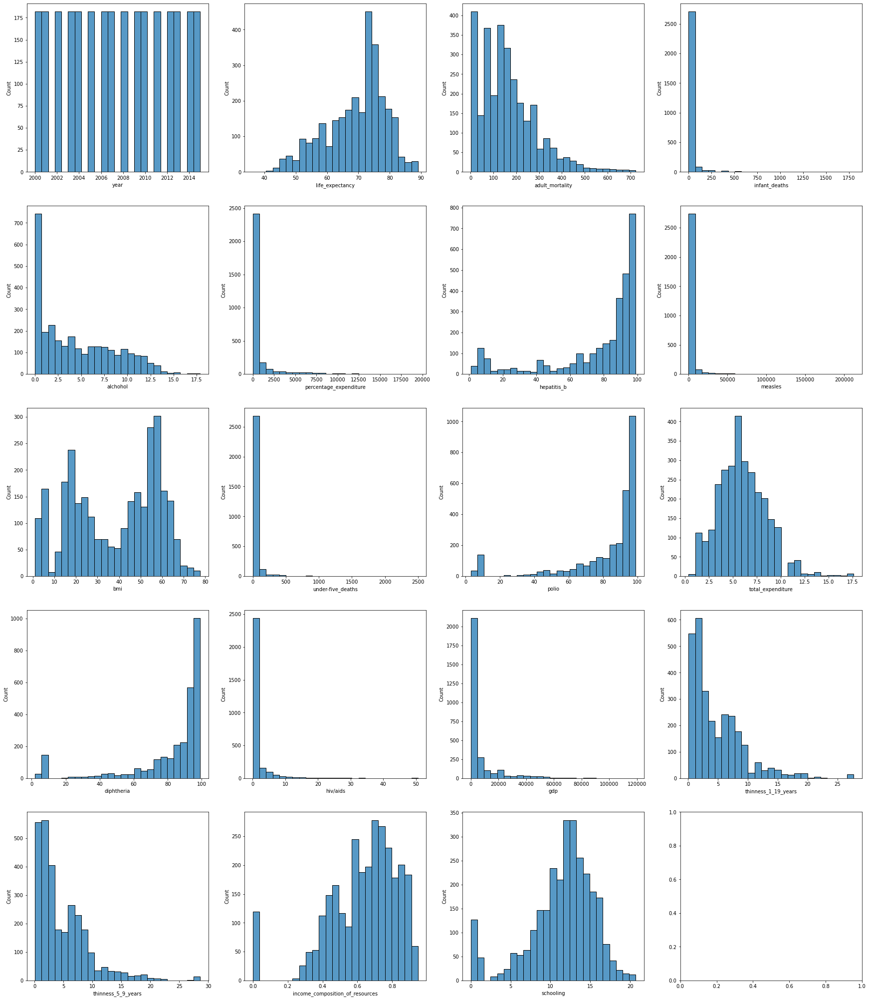

In [56]:

data_numeric = df.select_dtypes(include='number')
fig, ax = plt.subplots(ncols=4, nrows=5, figsize=(30, 36))
index = 0
ax = ax.flatten()

for col, value in data_numeric.items():
    sns.histplot(value, ax = ax[index],bins = 25)
    index += 1


### Distribution  plot

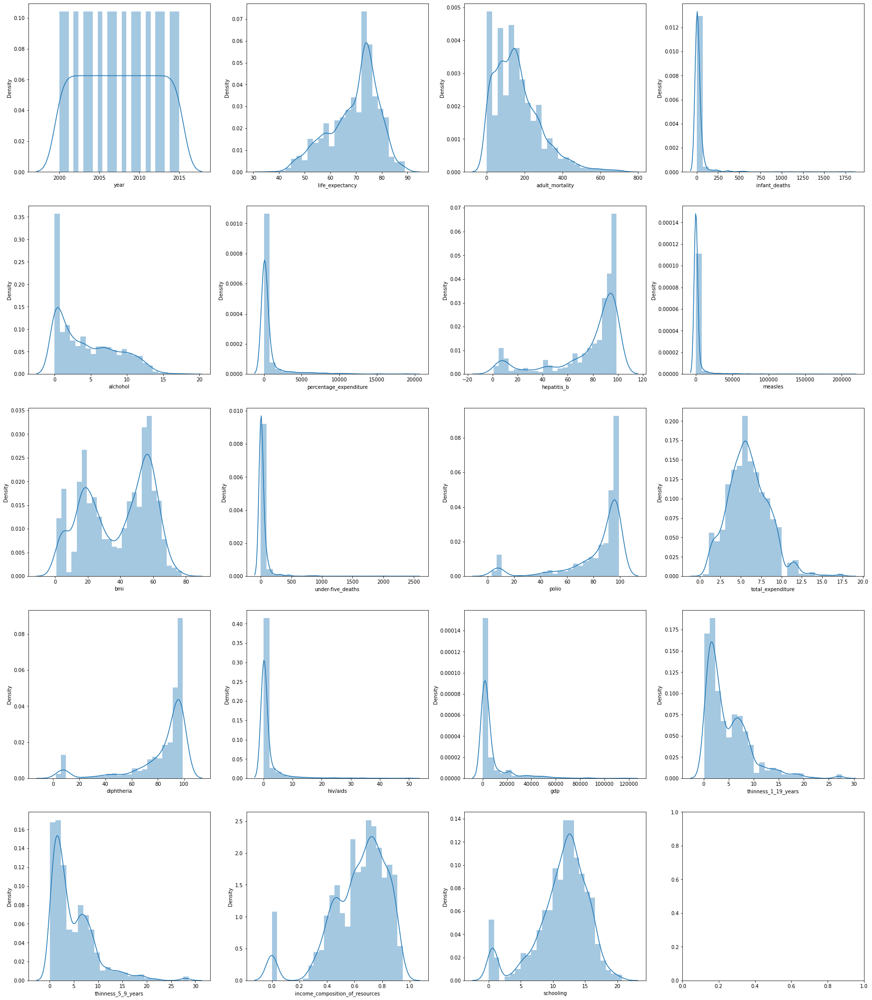

In [58]:

data_numeric = df.select_dtypes(include='number')
fig, ax = plt.subplots(ncols=4, nrows=5, figsize=(30, 36))
index = 0
ax = ax.flatten()

for col, value in data_numeric.items():
    sns.distplot(value, ax = ax[index],bins = 25)
    index += 1

#### The data features is highly skewed 

In [59]:
### boxplot

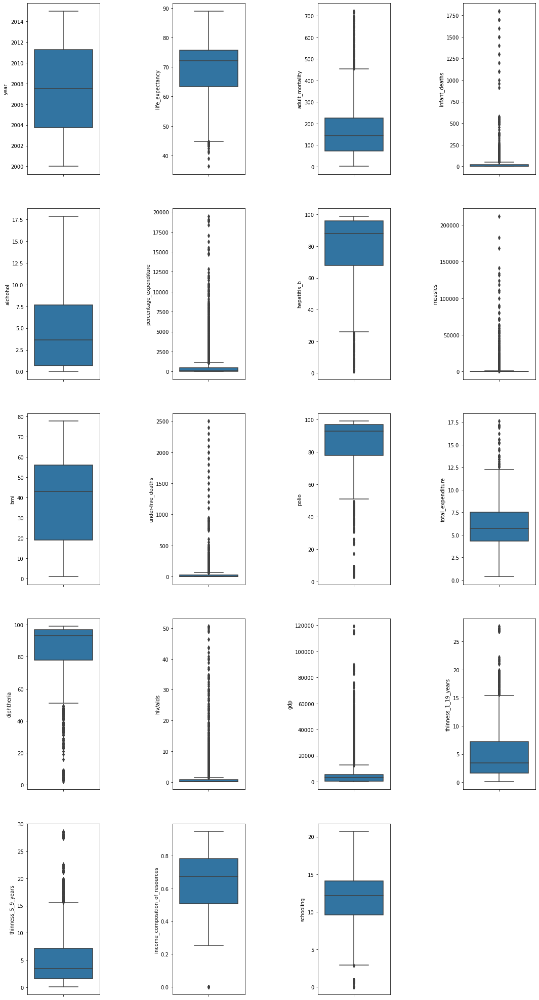

In [60]:
plt.figure(figsize=(18,36))
plt.subplots_adjust(wspace=1, hspace=None)


i = 1
for col_name in data_numeric:
    plt.subplot(5,4,i)
    sns.boxplot(data=df, y=col_name)
    i +=1

In [61]:
#### more columns have outliers

## Treating the outliers and skeweness

In [62]:
###skeweness
df.skew(axis = 0, numeric_only=True)

year                               0.00
life_expectancy                   -0.65
adult_mortality                    1.20
infant_deaths                      9.74
alchohol                           0.60
percentage_expenditure             4.63
hepatitis_b                       -1.52
measles                            9.40
bmi                               -0.22
under-five_deaths                  9.45
polio                             -2.08
total_expenditure                  0.59
diphtheria                        -2.06
hiv/aids                           5.38
gdp                                3.34
thinness_1_19_years                1.71
thinness_5_9_years                 1.78
income_composition_of_resources   -1.14
schooling                         -0.95
dtype: float64

### so we gonna use box and log transformations to adjust the skewness

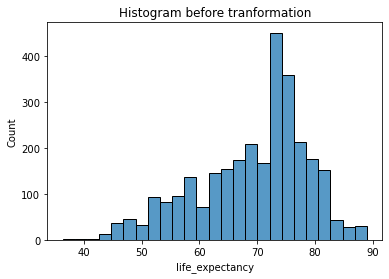

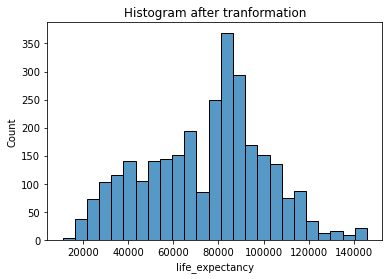

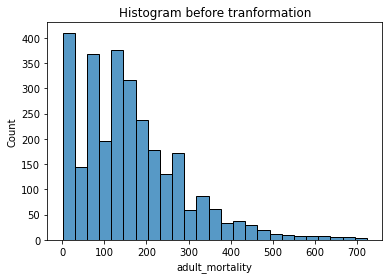

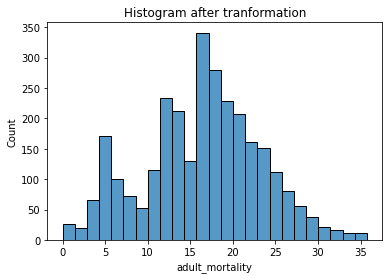

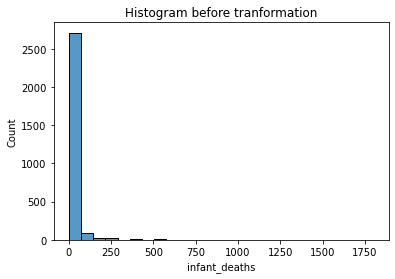

...

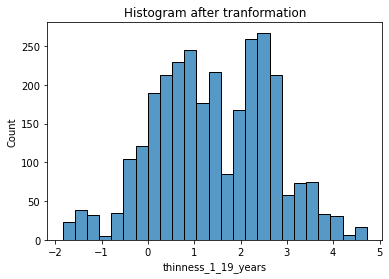

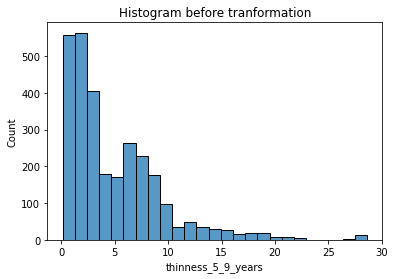

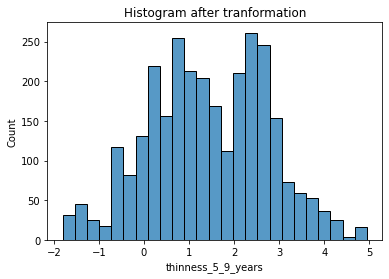

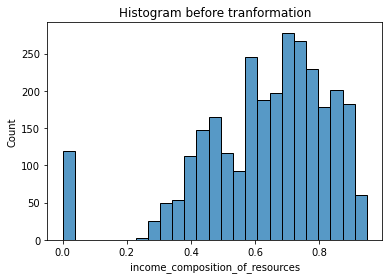

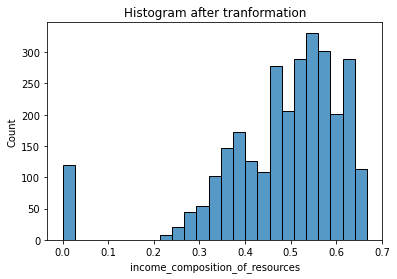

In [63]:
for column in df.columns.drop(['country','status','year','schooling']):
    #print(column)
    sns.histplot(data = df[column],  bins = 25)
    plt.title("Histogram before tranformation")
    plt.show()
    if ((df[column].min()>0)):
        df[column],fitted_lambda= scipy.stats.boxcox(df[column] ,lmbda=None)
    else:# using log(1+x) transformation
        df[column] = df[column] + 1
        df[column] = np.log(df[column])
    sns.histplot(data = df[column],  bins = 25)
    plt.title("Histogram after tranformation")
    plt.show()

In [64]:
df.skew(axis = 0, numeric_only=True)

year                               0.00
life_expectancy                   -0.10
adult_mortality                   -0.08
infant_deaths                      0.71
alchohol                          -0.39
percentage_expenditure            -0.09
hepatitis_b                       -0.98
measles                            0.55
bmi                               -0.32
under-five_deaths                  0.66
polio                             -1.05
total_expenditure                  0.01
diphtheria                        -1.07
hiv/aids                           0.69
gdp                               -0.01
thinness_1_19_years               -0.03
thinness_5_9_years                -0.04
income_composition_of_resources   -1.66
schooling                         -0.95
dtype: float64

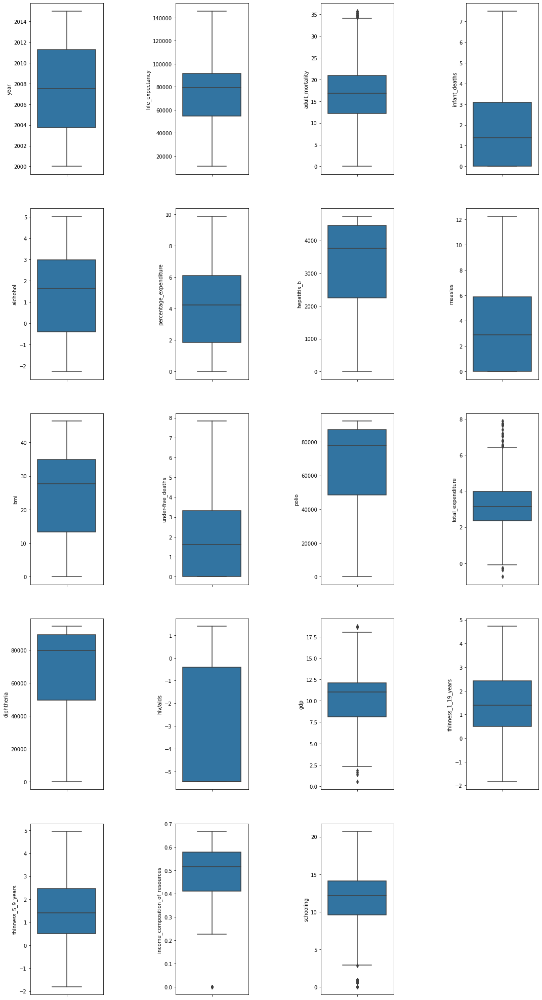

In [65]:
plt.figure(figsize=(18,36))
plt.subplots_adjust(wspace=1, hspace=None)


i = 1
for col_name in data_numeric:
    plt.subplot(5,4,i)
    sns.boxplot(data=df, y=col_name)
    i +=1

#### after transform the data using box and log transform it seem to be less outliers 

#### even though we gonna check the outliers and remove them

In [66]:
data_numeric = df.select_dtypes(include='number')

column_numeric = data_numeric.columns.drop('year')

cols = ['life_expectancy', 'adult_mortality',
       'infant_deaths', 'alchohol', 'percentage_expenditure', 'hepatitis_b',
       'measles', 'bmi', 'under-five_deaths', 'polio', 'total_expenditure',
       'diphtheria', 'hiv/aids', 'gdp', 'thinness_1_19_years',
       'thinness_5_9_years', 'income_composition_of_resources', 'schooling']
for i in cols:
    q1 = df[i].quantile(0.25)
    q2 = df[i].quantile(0.75)
    iqr = q2-q1

    l = q1-1.5*iqr
    u = q2+1.5*iqr
    print(i , len(df[df[i] > u]))
    #print(df[df[i] > u])
    out1 = df[(df[i] < l)].values
    out2 = df[(df[i] > u)].values

    #df[i] = np.where(df[i]>u,u,np.where(df[i]<l,l,df[i]))


life_expectancy 0
adult_mortality 12
infant_deaths 0
alchohol 0
percentage_expenditure 0
hepatitis_b 0
measles 0
bmi 0
under-five_deaths 0
polio 0
total_expenditure 25
diphtheria 0
hiv/aids 0
gdp 4
thinness_1_19_years 0
thinness_5_9_years 0
income_composition_of_resources 0
schooling 0


#### so we gonna remove the outliers using inter quantile method

In [68]:
for i in cols:
    q1 = df[i].quantile(0.25)
    q2 = df[i].quantile(0.75)
    iqr = q2-q1

    l = q1-1.5*iqr
    u = q2+1.5*iqr
    #print(i , len(df[df[i] > u]))
    #print(df[df[i] > u])
    out1 = df[(df[i] < l)].values
    out2 = df[(df[i] > u)].values

    df[i] = np.where(df[i]>u,u,np.where(df[i]<l,l,df[i]))
    print(i , len(df[df[i] > u]))

life_expectancy 0
adult_mortality 0
infant_deaths 0
alchohol 0
percentage_expenditure 0
hepatitis_b 0
measles 0
bmi 0
under-five_deaths 0
polio 0
total_expenditure 0
diphtheria 0
hiv/aids 0
gdp 0
thinness_1_19_years 0
thinness_5_9_years 0
income_composition_of_resources 0
schooling 0


In [69]:
df.shape

(2912, 21)

In [135]:
df.to_csv('life_expectancy_trained_data.csv')

#### Check the correlation between the data

income_composition_of_resources    0.75
schooling                          0.64
gdp                                0.59
diphtheria                         0.56
bmi                                0.55
polio                              0.55
percentage_expenditure             0.39
alchohol                           0.39
hepatitis_b                        0.35
total_expenditure                  0.23
year                               0.17
measles                           -0.31
thinness_1_19_years               -0.57
thinness_5_9_years                -0.58
adult_mortality                   -0.58
infant_deaths                     -0.59
under-five_deaths                 -0.61
hiv/aids                          -0.76
Name: life_expectancy, dtype: float64

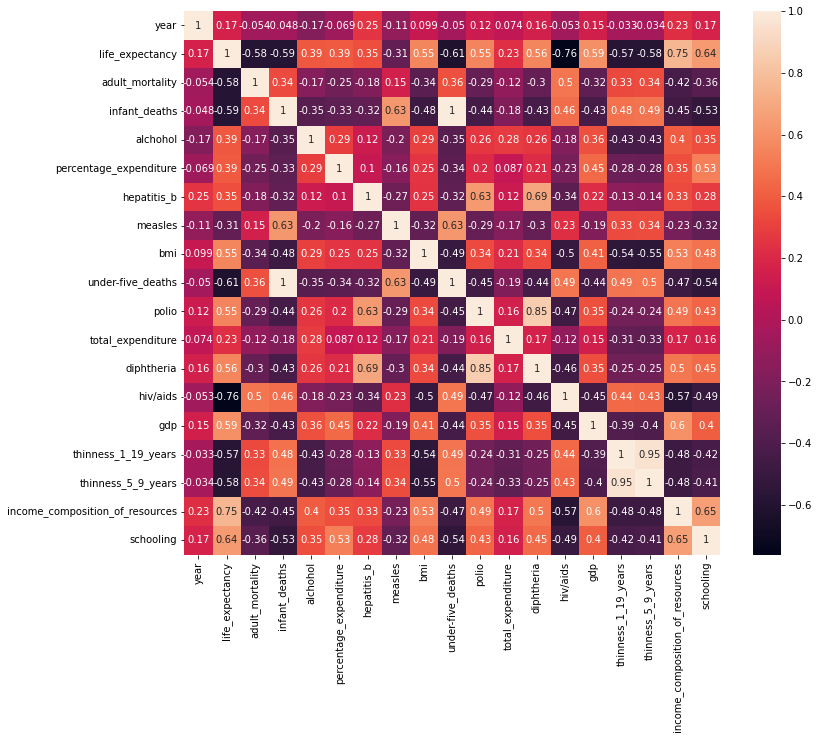

In [70]:
corr_matrix=df.corr()

plt.figure(1, figsize=(12,10))
sns.heatmap(corr_matrix, annot=True)

corr_matrix = corr_matrix.drop('life_expectancy')
corr_matrix['life_expectancy'].sort_values(ascending=False)

In [71]:
#### we have many columns which is have good corelation(0.5) with the target variable
#### the columns income_composition_of_resources,hiv/aids are higly correlated with target variabe
#### there is no multicolinearity with variables

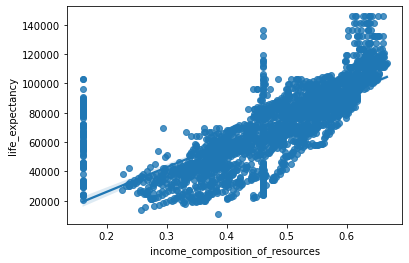

In [72]:
sns.regplot(x='income_composition_of_resources', y= 'life_expectancy',data = df )
plt.show()

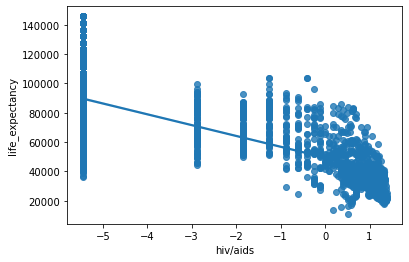

In [73]:
sns.regplot(x='hiv/aids', y= 'life_expectancy',data = df )
plt.show()

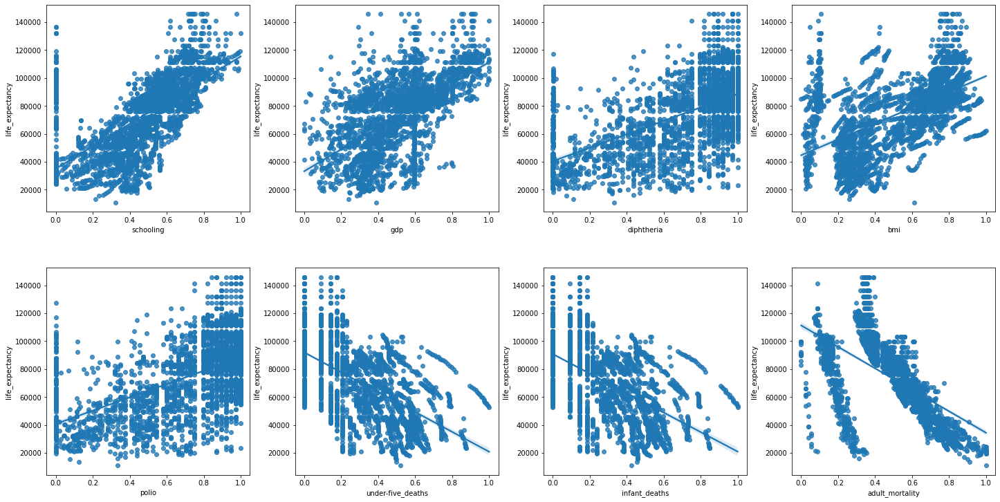

In [102]:
from sklearn import preprocessing
# Let's scale the columns before plotting them against life_expectancy
min_max_scaler = preprocessing.MinMaxScaler()
column_sels = ['schooling', 'gdp','diphtheria', 'bmi', 'polio', 'under-five_deaths', 'infant_deaths','adult_mortality']
x = df.loc[:,column_sels]
y = df['life_expectancy']
x = pd.DataFrame(data=min_max_scaler.fit_transform(x), columns=column_sels)
fig, axs = plt.subplots(ncols=4, nrows=2, figsize=(20, 10))
index = 0
axs = axs.flatten()
for i, k in enumerate(column_sels):
    sns.regplot(y=y, x=x[k], ax=axs[i])
plt.tight_layout(pad=0.4, w_pad=0.5, h_pad=5.0)

## Data Encoding and Preprocessing

In [74]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelEncoder

In [75]:
status_le = LabelEncoder()
country_le = LabelEncoder()

In [76]:
df['status'] = status_le.fit_transform(df['status'])
df['country'] = country_le.fit_transform(df['country'])

In [77]:
df

,country,year,status,life_expectancy,adult_mortality,infant_deaths,alchohol,percentage_expenditure,hepatitis_b,measles,bmi,under-five_deaths,polio,total_expenditure,diphtheria,hiv/aids,gdp,thinness_1_19_years,thinness_5_9_years,income_composition_of_resources,schooling
0,0,2015.00,1,58869.92,22.51,4.14,-2.26,4.28,2050.79,7.05,13.26,4.43,46.65,4.29,30157.66,-5.46,8.17,3.84,3.96,0.39,10.10
1,0,2014.00,1,46507.03,22.83,4.17,-2.26,4.31,1866.52,6.20,12.94,4.47,21714.52,4.30,26533.28,-5.46,8.25,3.87,3.98,0.39,10.00
2,0,2013.00,1,46507.03,22.71,4.20,-2.26,4.31,1988.41,6.07,12.61,4.50,26006.24,4.28,28916.95,-5.46,8.29,3.89,4.00,0.39,9.90
3,0,2012.00,1,45616.72,22.87,4.25,-2.26,4.37,2178.44,7.93,12.29,4.54,32075.06,4.45,32738.64,-5.46,8.39,3.91,4.03,0.38,9.80
4,0,2011.00,1,44956.34,22.98,4.28,-2.26,2.09,2243.70,8.01,12.03,4.58,33386.22,4.16,34079.62,-5.46,4.87,3.94,4.05,0.37,9.50
5,0,2010.00,1,44085.60,23.14,4.32,-2.26,4.39,2114.14,7.60,11.70,4.63,30796.82,4.75,31431.43,-5.46,8.08,3.96,4.07,0.37,9.20
6,0,2009.00,1,43654.39,23.21,4.36,-2.26,4.06,1926.98,7.96,11.37,4.67,27156.23,4.84,27708.94,-5.46,7.74,3.98,4.10,0.36,8.90
7,0,2008.00,1,42588.45,23.44,4.39,-2.00,3.29,1988.41,7.38,11.04,4.71,28337.76,4.37,28916.95,-5.46,7.46,4.00,4.12,0.36,8.70
8,0,2007.00,1,41331.95,23.74,4.42,-2.11,2.48,1926.98,7.04,10.71,4.74,27156.23,3.63,27708.94,-5.46,7.44,4.02,4.14,0.35,8.40
9,0,2006.00,1,40918.56,23.74,4.44,-2.00,2.90,1988.41,7.60,10.38,4.76,21714.52,3.96,22146.70,-5.46,6.97,4.04,4.16,0.34,8.10


### split the data into train and test

In [78]:
from sklearn.model_selection import train_test_split
from sklearn import metrics
import math
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import cross_val_score
from sklearn.metrics import r2_score
from sklearn.linear_model import LinearRegression

In [79]:
# split the data into input and target variables
x = df.drop('life_expectancy',axis=1)
y = df['life_expectancy']

In [80]:
x

,country,year,status,adult_mortality,infant_deaths,alchohol,percentage_expenditure,hepatitis_b,measles,bmi,under-five_deaths,polio,total_expenditure,diphtheria,hiv/aids,gdp,thinness_1_19_years,thinness_5_9_years,income_composition_of_resources,schooling
0,0,2015.00,1,22.51,4.14,-2.26,4.28,2050.79,7.05,13.26,4.43,46.65,4.29,30157.66,-5.46,8.17,3.84,3.96,0.39,10.10
1,0,2014.00,1,22.83,4.17,-2.26,4.31,1866.52,6.20,12.94,4.47,21714.52,4.30,26533.28,-5.46,8.25,3.87,3.98,0.39,10.00
2,0,2013.00,1,22.71,4.20,-2.26,4.31,1988.41,6.07,12.61,4.50,26006.24,4.28,28916.95,-5.46,8.29,3.89,4.00,0.39,9.90
3,0,2012.00,1,22.87,4.25,-2.26,4.37,2178.44,7.93,12.29,4.54,32075.06,4.45,32738.64,-5.46,8.39,3.91,4.03,0.38,9.80
4,0,2011.00,1,22.98,4.28,-2.26,2.09,2243.70,8.01,12.03,4.58,33386.22,4.16,34079.62,-5.46,4.87,3.94,4.05,0.37,9.50
5,0,2010.00,1,23.14,4.32,-2.26,4.39,2114.14,7.60,11.70,4.63,30796.82,4.75,31431.43,-5.46,8.08,3.96,4.07,0.37,9.20
6,0,2009.00,1,23.21,4.36,-2.26,4.06,1926.98,7.96,11.37,4.67,27156.23,4.84,27708.94,-5.46,7.74,3.98,4.10,0.36,8.90
7,0,2008.00,1,23.44,4.39,-2.00,3.29,1988.41,7.38,11.04,4.71,28337.76,4.37,28916.95,-5.46,7.46,4.00,4.12,0.36,8.70
8,0,2007.00,1,23.74,4.42,-2.11,2.48,1926.98,7.04,10.71,4.74,27156.23,3.63,27708.94,-5.46,7.44,4.02,4.14,0.35,8.40
9,0,2006.00,1,23.74,4.44,-2.00,2.90,1988.41,7.60,10.38,4.76,21714.52,3.96,22146.70,-5.46,6.97,4.04,4.16,0.34,8.10


### Visualize the importance of the features

In [82]:
from sklearn.ensemble import ExtraTreesRegressor
model = ExtraTreesRegressor()
model.fit(x,y)
print(model.feature_importances_)

[0.00733426 0.01069034 0.06078872 0.08288444 0.01478881 0.01334841
 0.00628487 0.00410379 0.007455   0.02166833 0.01265098 0.00775684
 0.00854795 0.00691163 0.43387551 0.00596308 0.01636969 0.020742
 0.23313768 0.02469765]


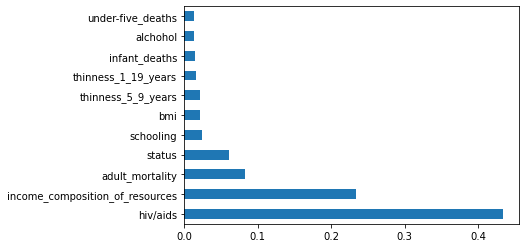

In [83]:
feat_importance = pd.Series(model.feature_importances_,index = x.columns)
feat_importance.nlargest(11).plot(kind = 'barh')
plt.show()

In [84]:
# spilt the data into test and train
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.25, random_state=42)

In [85]:
print(x_train.shape)
print(x_test.shape)

(2184, 20)
(728, 20)


In [86]:
# normalize the train and test data
scaler = MinMaxScaler()

In [87]:
X_train = scaler.fit_transform(x_train)
X_test = scaler.transform(x_test)

## Model buliding 

### Linear Regression

In [90]:
from sklearn.linear_model import LinearRegression
lr = LinearRegression()

In [91]:
linear_reg_model = lr.fit(X_train,y_train)

y_pred = linear_reg_model.predict(X_test)

print('Test metrics:')
print()
print("R^2 score:",r2_score(y_test, y_pred))
print('MAE:',mean_absolute_error(y_test, y_pred))
print('MSE :', mean_squared_error(y_test,y_pred))
print("RMSE : ",math.sqrt(mean_squared_error(y_test,y_pred)))

Test metrics:

R^2 score: 0.816522661199764
MAE: 8310.263790570487
MSE : 128223779.22724295
RMSE :  11323.593918330123


### Lasso Regression

In [93]:
from sklearn.model_selection import GridSearchCV

from sklearn.experimental import enable_halving_search_cv
from sklearn.model_selection import HalvingGridSearchCV

In [94]:
from sklearn.linear_model import Lasso

lasso = Lasso()

param_grid = {
            "alpha": [1e0, 0.1, 1e-2, 1e-3],
            'tol': [1]
             }
grid = HalvingGridSearchCV(lasso, param_grid, refit = True, verbose = -1, n_jobs=-1, return_train_score = True)

lasso_best_model = grid.fit(X_train, y_train) 

print(grid.best_params_)

n_iterations: 2
n_required_iterations: 2
n_possible_iterations: 2
min_resources_: 728
max_resources_: 2184
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 4
n_resources: 728
----------
iter: 1
n_candidates: 2
n_resources: 2184
{'alpha': 1.0, 'tol': 1}


In [95]:
y_train_pred = lasso_best_model.predict(X_train)
y_pred = lasso_best_model.predict(X_test)

print('Test metrics:')
print()
print("R^2 score:",r2_score(y_test, y_pred))
print('MAE:',mean_absolute_error(y_test, y_pred))
print('MSE :', mean_squared_error(y_test,y_pred))
print("RMSE : ",math.sqrt(mean_squared_error(y_test,y_pred)))

Test metrics:

R^2 score: 0.7261769304964169
MAE: 10674.293249273513
MSE : 191362208.7661775
RMSE :  13833.373007555949


### KNN

In [97]:
from sklearn.neighbors import KNeighborsRegressor

knn = KNeighborsRegressor()

param_grid = {
            'n_neighbors':[1,2,3,4,5,6,7,8,9],
            'weights':['uniform', 'distance'],
            'algorithm':['auto', 'ball_tree', 'kd_tree', 'brute'],
            'p':[1,2],
             }
grid = HalvingGridSearchCV(knn, param_grid, refit = True, verbose = -1, n_jobs=-1, return_train_score = True)

knn_best_model = grid.fit(X_train, y_train) 

print(grid.best_params_) 


n_iterations: 5
n_required_iterations: 5
n_possible_iterations: 5
min_resources_: 26
max_resources_: 2184
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 144
n_resources: 26
----------
iter: 1
n_candidates: 48
n_resources: 78
----------
iter: 2
n_candidates: 16
n_resources: 234
----------
iter: 3
n_candidates: 6
n_resources: 702
----------
iter: 4
n_candidates: 2
n_resources: 2106
{'algorithm': 'brute', 'n_neighbors': 6, 'p': 1, 'weights': 'distance'}


In [98]:
y_train_pred = knn_best_model.predict(X_train)
y_pred = knn_best_model.predict(X_test)
print('Testng metrics:')
print()
print("R^2 score:",r2_score(y_test, y_pred))
print('MAE:',mean_absolute_error(y_test, y_pred))
print('MSE :', mean_squared_error(y_test,y_pred))
print("RMSE : ",math.sqrt(mean_squared_error(y_test,y_pred)))
print()
print('Training metrics:')
print()
print("R^2 score:",r2_score(y_train, y_train_pred))
print('MAE:',mean_absolute_error(y_test, y_pred))
print('MSE :', mean_squared_error(y_test,y_pred))
print("RMSE : ",math.sqrt(mean_squared_error(y_train,y_train_pred)))

Testng metrics:

R^2 score: 0.9441857885397593
MAE: 3794.9789543723246
MSE : 39005956.67464162
RMSE :  6245.474895845921

Training metrics:

R^2 score: 1.0
MAE: 3794.9789543723246
MSE : 39005956.67464162
RMSE :  0.0


### RandomForestRegressor

In [119]:
from sklearn.ensemble import RandomForestRegressor

rfr = RandomForestRegressor()

rfr_model = rfr.fit(X_train, y_train) 
y_train_pred = rfr_model.predict(X_train)
y_pred = rfr_model.predict(X_test)

In [120]:

print('Testng metrics:')
print()
print("R^2 score:",r2_score(y_test, y_pred))
print('MAE:',mean_absolute_error(y_test, y_pred))
print('MSE :', mean_squared_error(y_test,y_pred))
print("RMSE : ",math.sqrt(mean_squared_error(y_test,y_pred)))

Testng metrics:

R^2 score: 0.9546273485945185
MAE: 3410.256579476681
MSE : 31708835.951154687
RMSE :  5631.059931412086


### SVM

In [105]:
from sklearn.svm import SVR

svr = SVR()
param_grid = {
              'kernel': ['linear','poly', 'rbf', 'sigmoid'],
              'C': [10000,50000,100000,500000],   
              'gamma':['scale', 'auto'],
              }
grid = HalvingGridSearchCV(svr, param_grid, refit = True, verbose = -1,n_jobs=-1)

svr_best_model = grid.fit(X_train, y_train) 

print(grid.best_params_) 


n_iterations: 4
n_required_iterations: 4
n_possible_iterations: 4
min_resources_: 80
max_resources_: 2184
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 32
n_resources: 80
----------
iter: 1
n_candidates: 11
n_resources: 240
----------
iter: 2
n_candidates: 4
n_resources: 720
----------
iter: 3
n_candidates: 2
n_resources: 2160
{'C': 100000, 'gamma': 'scale', 'kernel': 'rbf'}


In [106]:
y_train_pred = svr_best_model.predict(X_train)
y_pred = svr_best_model.predict(X_test)

print('Testng metrics:')
print()
print("R^2 score:",r2_score(y_test, y_pred))
print('MAE:',mean_absolute_error(y_test, y_pred))
print('MSE :', mean_squared_error(y_test,y_pred))
print("RMSE : ",math.sqrt(mean_squared_error(y_test,y_pred)))

Testng metrics:

R^2 score: 0.9314265584369651
MAE: 4229.533212522796
MSE : 47922789.20833969
RMSE :  6922.628778747254


### DecisionTreeRegressor

In [107]:
from sklearn.tree import DecisionTreeRegressor

dtr = DecisionTreeRegressor()

In [113]:
from sklearn.tree import DecisionTreeRegressor

dtr = DecisionTreeRegressor()
dtr_model = dtr.fit(X_train, y_train)
y_train_pred = dtr_model.predict(X_train)
y_pred = dtr_model.predict(X_test)


In [114]:
print('Testng metrics:')
print()
print("R^2 score:",r2_score(y_test, y_pred))
print('MAE:',mean_absolute_error(y_test, y_pred))
print('MSE :', mean_squared_error(y_test,y_pred))
print("RMSE : ",math.sqrt(mean_squared_error(y_test,y_pred)))

Testng metrics:

R^2 score: 0.9029323967328464
MAE: 4733.486539547848
MSE : 67836033.6640608
RMSE :  8236.263331393722


### XGBOOST REGRESSION

In [115]:
import xgboost as xgb 
xg_reg = xgb.XGBRegressor(n_estimators=100, learning_rate=0.08, gamma=0, subsample=0.75,
                           colsample_bytree=1, max_depth=7)
xg_reg.fit(X_train,y_train) 
y_pred = xg_reg.predict(X_test)

In [116]:
print('Testng metrics:')
print()
print("R^2 score:",r2_score(y_test, y_pred))
print('MAE:',mean_absolute_error(y_test, y_pred))
print('MSE :', mean_squared_error(y_test,y_pred))
print("RMSE : ",math.sqrt(mean_squared_error(y_test,y_pred)))

Testng metrics:

R^2 score: 0.9554043101936269
MAE: 3425.8727425386287
MSE : 31165853.623181254
RMSE :  5582.63858969764


### GradientBoostingRegressor

In [117]:
from sklearn.ensemble import GradientBoostingRegressor

gbr = GradientBoostingRegressor()
param_grid = {
                'learning_rate': [0.008,0.01,0.03],
                'subsample'    : [0.8, 0.5, 0.3],
                'n_estimators' : [500,1000],
                'max_depth'    : [6,8,12,14]
             }
grid = HalvingGridSearchCV(gbr, param_grid, refit = True, verbose = -1,n_jobs=-1)

gbr_best_model = grid.fit(X_train, y_train) 

print(grid.best_params_)


n_iterations: 4
n_required_iterations: 4
n_possible_iterations: 4
min_resources_: 80
max_resources_: 2184
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 72
n_resources: 80
----------
iter: 1
n_candidates: 24
n_resources: 240
----------
iter: 2
n_candidates: 8
n_resources: 720
----------
iter: 3
n_candidates: 3
n_resources: 2160
{'learning_rate': 0.03, 'max_depth': 6, 'n_estimators': 1000, 'subsample': 0.5}


In [118]:
y_train_pred = gbr_best_model.predict(X_train)
y_pred = gbr_best_model.predict(X_test)

print('Testng metrics:')
print()
print("R^2 score:",r2_score(y_test, y_pred))
print('MAE:',mean_absolute_error(y_test, y_pred))
print('MSE :', mean_squared_error(y_test,y_pred))
print("RMSE : ",math.sqrt(mean_squared_error(y_test,y_pred)))

Testng metrics:

R^2 score: 0.9594845985587198
MAE: 3138.3835102668745
MSE : 28314329.84411231
RMSE :  5321.121107822327


### Neural Network

In [121]:
from sklearn.neural_network import MLPRegressor

mlp = MLPRegressor()

param_grid = {
                "alpha": [1 ,10, 100],
                'learning_rate_init': [0.01,0.05],
                'max_iter': [2000],
                'tol': [0.5],
             }
grid = HalvingGridSearchCV(mlp, param_grid, refit = True, verbose = -1,n_jobs=-1)

mlp_best_model = grid.fit(X_train, y_train) 

print(grid.best_params_)


n_iterations: 2
n_required_iterations: 2
n_possible_iterations: 2
min_resources_: 728
max_resources_: 2184
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 6
n_resources: 728
----------
iter: 1
n_candidates: 2
n_resources: 2184
{'alpha': 100, 'learning_rate_init': 0.05, 'max_iter': 2000, 'tol': 0.5}


In [122]:
y_train_pred = mlp_best_model.predict(X_train)
y_pred = mlp_best_model.predict(X_test)

print('Testng metrics:')
print()
print("R^2 score:",r2_score(y_test, y_pred))
print('MAE:',mean_absolute_error(y_test, y_pred))
print('MSE :', mean_squared_error(y_test,y_pred))
print("RMSE : ",math.sqrt(mean_squared_error(y_test,y_pred)))

Testng metrics:

R^2 score: 0.8146153749410148
MAE: 8393.901535311146
MSE : 129556692.89257179
RMSE :  11382.29734687035


In [123]:
models = []

models.append(('Linear Regression', linear_reg_model))
models.append(('Lasso(Linear) Regression', lasso_best_model))
models.append(('K Nearest Neighbour', knn_best_model))
models.append(('Support Vector', svr_best_model))
models.append(('Decision Tree', dtr_model))
models.append(('Random Forest', rfr_model))
models.append(('XGBOOST Regressor', xg_reg))
models.append(("Gradient Boost", gbr_best_model))
models.append(("Neural Network", mlp_best_model))



model_name = []
RMSE = []
R2 = []

Y_TEST_PRED = []

    
for name, model in models:
    model_name.append(name)
    y_test_pred = model.predict(X_test)
    rmse = math.sqrt(mean_squared_error(y_test_pred,y_test))
    r2 = r2_score(y_test, y_test_pred)
        
    RMSE.append(rmse)
    R2.append(r2)
    Y_TEST_PRED.append(y_test_pred)
        
model_score = pd.DataFrame(zip(model_name, RMSE, R2) , columns=['Name', 'RMSE','R2'])

model_score = model_score.sort_values(by='RMSE', ascending=False)

model_score

,Name,RMSE,R2
1,Lasso(Linear) Regression,13833.37,0.73
8,Neural Network,11382.30,0.81
0,Linear Regression,11323.59,0.82
3,Support Vector,8725.64,0.89
4,Decision Tree,8236.26,0.90
2,K Nearest Neighbour,6245.47,0.94
5,Random Forest,5631.06,0.95
6,XGBOOST Regressor,5582.64,0.96
7,Gradient Boost,5321.12,0.96


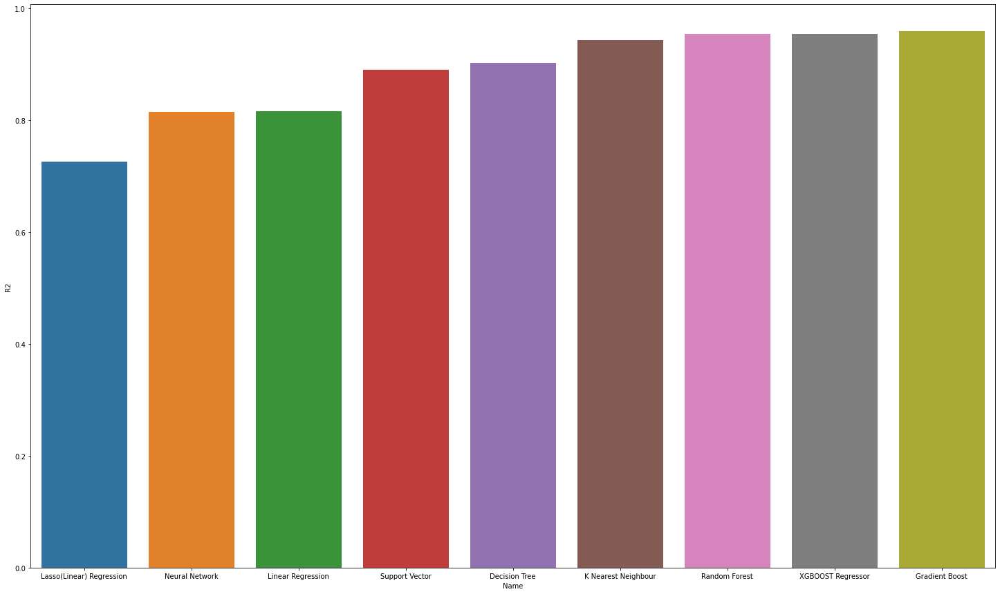

In [125]:
fig = plt.figure(figsize =(25, 15))
sns.barplot(x='Name',y= 'R2',data=model_score)
plt.show()

### we get the best accuracy for xgboost and gradient boost models
### so we gonna deploye the gradient boost model using streamlit

In [128]:
import pickle

In [132]:
filename = 'life_expectancy_trained_data.csv'
pickle.dump(gbr_best_model, open(filename,'wb'))

In [133]:
load_data = pickle.load(open('life_expectancy_trained_data.csv','rb'))

In [134]:
load_data

HalvingGridSearchCV(estimator=GradientBoostingRegressor(), n_jobs=-1,
                    param_grid={'learning_rate': [0.008, 0.01, 0.03],
                                'max_depth': [6, 8, 12, 14],
                                'n_estimators': [500, 1000],
                                'subsample': [0.8, 0.5, 0.3]},
                    refit=<function _refit_callable at 0x000002CA5B0C7820>,
                    verbose=-1)